In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam')


from spikeparam.patch.fit import Spike
from spikeparam.patch.fit import SpikeGroup



from neurodsp import spectral

from scipy import signal
import scipy

import h5py
from tqdm.notebook import tqdm

import numpy as np
import pandas as pd

from neurodsp import filt
from neurodsp.timefrequency import amp_by_time, phase_by_time
from neurodsp.plts import plot_time_series, plot_instantaneous_measure
from neurodsp.plts.time_series import plot_bursts
from neurodsp.burst import detect_bursts_dual_threshold, compute_burst_stats

from scipy.signal import sosfiltfilt, butter

from scipy.signal import find_peaks
from scipy.optimize import curve_fit
from scipy.stats import pearsonr
import statsmodels.api as sm
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import scipy.spatial as sp_spatial

import os

from fooof import FOOOF

sns.set(rc={'figure.figsize':(12,9)})
sns.set_style('whitegrid')
sns.set_style("whitegrid", {'axes.grid' : False})


/var/folders/rr/tk8wmt7x4xlgzgmcy768y1rm0000gn/T/ipykernel_25219/2189449789.py:45: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


In [5]:
def butter_bandpass(data, fs, filt_freq, order):
    # make sure that the user provides two frequencies for bandpass filter
    try:
        # renormalize frequencies in Hz to fractional scale required by butter
        nyq = 0.5 * fs # nyquist frequency
        f0 = (filt_freq[0]/nyq)
        f1 = (filt_freq[1]/nyq)

        # highpass first
        sos = butter(order, f0, btype = 'high', analog=False, output='sos')
        y = sosfiltfilt(sos, data)

        # then lowpass
        sos = butter(order, f1, btype = 'low', analog=False, output='sos')
        y = sosfiltfilt(sos, y)
        
        return y
    
    except:
        print("filt_freq must have two frequencies for a bandpass filter")

In [6]:
def in_burst_to_burst_range_ms(is_burst_array, ms_convert=True):

    """Convert boolean array of whether each idx is in burst, to range of bursts in ms"""

    s = pd.Series(is_burst_array)
    grp = s.eq(False).cumsum()
    arr = grp.loc[s.eq(True)] \
             .groupby(grp) \
             .apply(lambda x: [x.index.min(), x.index.max()])
    
    if ms_convert:
        arr = [[i[0] / lfp_one_ms, i[1] / lfp_one_ms] for i in arr.values]
    else:
        arr = arr.values
    
    
    
    return arr
    

In [7]:
def get_patch_fs_metadata(metadata_file, cell_num):
    
    metafile = pd.read_excel(metadata_file, sheet_name='Sheet1')
    #get index for cell
    cells = metafile['Cell']
    index_cell = cells[cells == "c"+str(cell_num)].index[0]
    
    #get path fs for cell
    
    patch_fs = metafile['Patch Samp. Freq. (Hz)'][index_cell]
    
    return patch_fs
    

In [8]:
def upper(df):
    '''Returns the upper triangle of a correlation matrix.
    You can use scipy.spatial.distance.squareform to recreate matrix from upper triangle.
    Args:
      df: pandas or numpy correlation matrix
    Returns:
      list of values from upper triangle
    '''
    try:
        assert(type(df)==np.ndarray)
    except:
        if type(df)==pd.DataFrame:
            df = df.values
        else:
            raise TypeError('Must be np.ndarray or pd.DataFrame')
    mask = np.triu_indices(df.shape[0], k=1)
    return df[mask]

In [9]:
def spk_lfp_class(spk_times_ms, ranges_not_burst_low_ms, gamma_bursts_ms):
    """Classify spikes based on whether they occur during LFP gamma burst 
    or not during gamma oscillations """
    spk_class = []
    spk_idx = []
    spk_idx_ms = []

    for counter, spk in enumerate(spk_times_ms):
        found = False

        for no_burst in ranges_not_burst_low_ms:
            if no_burst[0] <= spk <= no_burst[1]:
                found = True
                spk_class.append('no_gamma')
                spk_idx_ms.append(spk)
                spk_idx.append(counter)
                break

        if not found:
            for burst in gamma_bursts_ms:
                if burst[0] <= spk <= burst[1]:
                    found = True
                    spk_class.append('gamma')
                    spk_idx_ms.append(spk)
                    spk_idx.append(counter)
                    break

    return spk_class, spk_idx, spk_idx_ms

In [10]:
def get_lowest_analytical_amp(gamma_amp, ranges_not_burst, one_ms, thresh=0.25):
    
    no_burst_mean_amp = []
    no_burst_mean_ranges = []

    for r in ranges_not_burst:

        am_range = gamma_amp[slice(*r)]
        #take mean of analytic amplitude for that range 
        mean_am = np.nanmean(am_range)
        no_burst_mean_amp.append(mean_am)
        no_burst_mean_ranges.append(r)
        
    #Select 25% (default) no burst sections with lowest analytical amplitude 
    n_lowest = int(len(no_burst_mean_amp) * thresh)
    no_burst_mean_amp_array = np.array(no_burst_mean_amp, dtype=np.float32)
    lowest_amp_no_bursts = no_burst_mean_amp_array.argsort()[:n_lowest]

    #get the index range of the sections with lowest amplitude 
    ranges_not_burst_low =  [ranges_not_burst[i] for i in lowest_amp_no_bursts]

    #convert to ms
    ranges_not_burst_low_ms = [(x/one_ms, y/one_ms) for x,y in ranges_not_burst_low]
    
    return ranges_not_burst_low_ms
    

In [11]:
def visualize_lfp_gamma_regions(lfp_times, lfp_filt, gamma_groups, no_gamma_groups,title=None, xlim=None, plot_spk=False, spk_gamma=None, spk_nogamma=None):
    plt.plot(lfp_times, lfp_filt, label="LFP")
    #loop through gamma groups
    plt.axvspan(gamma_groups[0][0], gamma_groups[0][1], alpha=0.3, color="red", label="gamma")
    for g in gamma_groups[1:]:
        plt.axvspan(g[0], g[1], alpha=0.3, color="red")

    #loop through non gamma groups
    plt.axvspan(no_gamma_groups[0][0], no_gamma_groups[0][1], alpha=0.3, color="green", label="low amp no gamma")
    for ng in no_gamma_groups[1:]:
        plt.axvspan(ng[0], ng[1], alpha=0.3, color="green")
    
    plt.xlabel('Time (ms)')
    plt.ylabel('Voltage (mV)')
    if xlim ==None:
        plt.title(title + " full recording")
        if plot_spk:
            plt.eventplot(spk_gamma,lineoffsets = 80, linelengths=10, color='darkred', label = 'gamma spikes')
            plt.eventplot(spk_nogamma,lineoffsets = 80, linelengths=10,color = 'darkgreen', label = 'no gamma spikes')
            
        plt.legend(loc="lower left")
        plt.show()
    else:
        plt.xlim(xlim)
        plt.title(title + " from " +str(xlim[0])+ " ms to " + str(xlim[1]) + " ms")
        if plot_spk:
            plt.eventplot(spk_gamma,lineoffsets = 80, linelengths=10, color='darkred', label = 'gamma spikes')
            plt.eventplot(spk_nogamma,lineoffsets = 80, linelengths=10,color = 'darkgreen', label = 'no gamma spikes')
        plt.legend(loc="lower left")
        

In [12]:
metadata_dir = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Data Summary.xlsx'
patch_fs_c42 = get_patch_fs_metadata(metadata_dir, 42)
patch_fs_c14 = get_patch_fs_metadata(metadata_dir, 14)

patch_fs = {'c42':patch_fs_c42, 'c14':patch_fs_c14}


/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [13]:
npx_fs = 30000 # sampling rate
lfp_fs = 2500 # sampling rate


npx_channels = 384
npx_patch_channel = 161

data_path = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/all_recordings/'

out_lfp_path = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_lfp_recordings/'

out_npx_path = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_npx_recordings/'

out_patch_path = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_patch_recordings/'

cell_ids = ['c14', 'c42']

In [14]:
#load_spe1_data(data_path, lfp_fs, npx_fs, patch_fs, cell_ids, npx_channels, npx_patch_channel, out_lfp_path, out_npx_path, out_patch_path)
#load in load notebook


## Cell 42  (Whole patch, IC)
### Analze Gamma LFP and whole patch clamp AP relationship for cell 42

### LFP Gamma "burst detection" method

In [15]:
lfp_c14= '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_lfp_recordings/c14_lfp_filt.npy'
patch_c14 = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_patch_recordings/c14patch_filt.npy'


In [16]:
#get cell number 
cell_num = lfp_c14.split('/')[len(lfp_c14.split('/'))-1].split('_')[0]

lfp_filt_c14 = np.load(lfp_c14)
lfp_fs = 2500 # sampling rate
lfp_one_ms = int(lfp_fs / 1000)
lfp_times_c14 = np.arange(0, np.shape(lfp_filt_c14)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt_c14 = np.load(patch_c14)
patch_c14_one_ms = int(patch_fs_c14  / 1000)
patch_times_c14 = np.arange(0, np.shape(patch_filt_c14 )[0]) / patch_c14_one_ms # in ms instead of sec

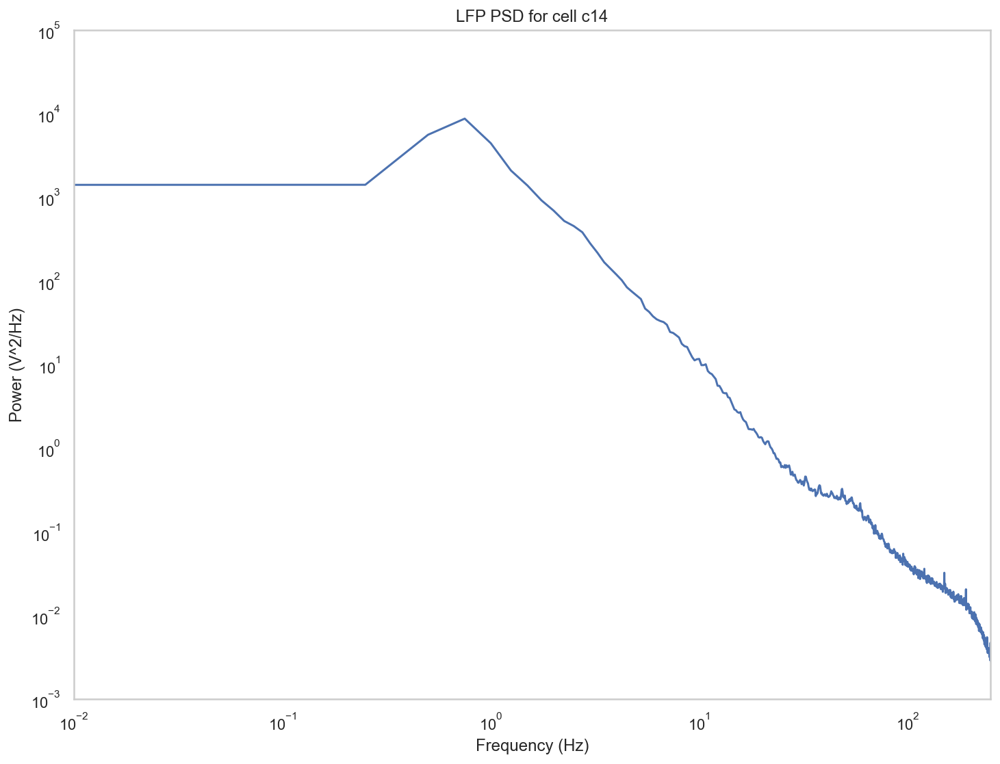

In [18]:
#plot PSD for cell 42
# plot power spectrum
fxx_c14, pxx_c14 = spectral.compute_spectrum(lfp_filt_c14, lfp_fs, method='welch', window='hann', nperseg=lfp_fs*4)

xlim = (10e-3, 250)
ylim = (10e-4, 10e4)
plt.loglog(fxx_c14, pxx_c14)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (V^2/Hz)')
plt.xlim(xlim)
plt.ylim(ylim)
plt.title("LFP PSD for cell "+ cell_num)
plt.show()


#### 0. Use specpram to find gamma peaks

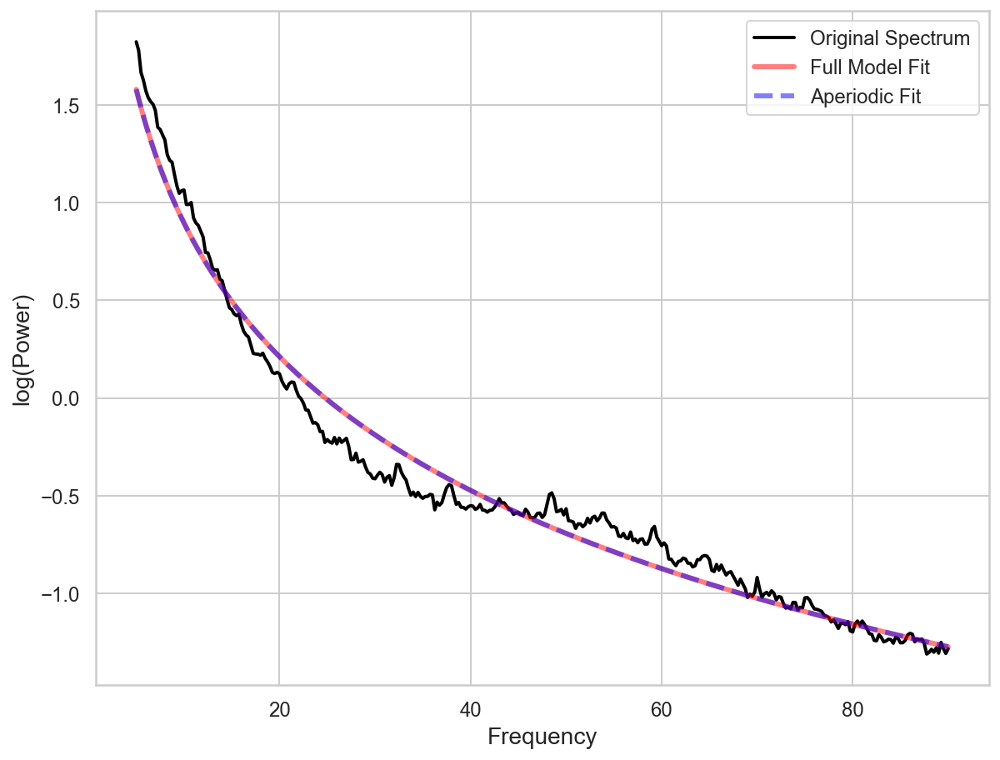

In [19]:
fm_c42 = FOOOF(max_n_peaks=0, verbose=False)
fm_c42.fit(fxx_c14, pxx_c14, freq_range=(5,90))
fm_c42.plot()

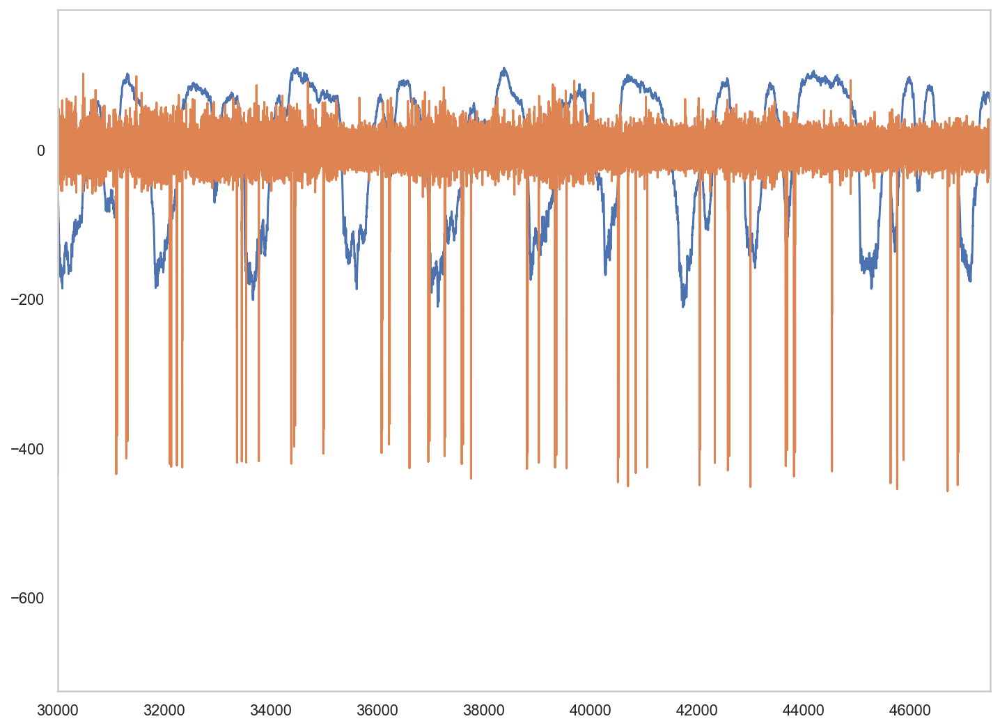

In [20]:
#plot raw LFP and patch data
plt.plot(lfp_times_c14, lfp_filt_c14)
plt.plot(patch_times_c14, patch_filt_c14)
plt.xlim(30000,47500)
plt.show()

#### 1. Filter the signal in +/- 15 Hz around that gamma peak

In [21]:
gamma_peak = 40 #Hz 
gamma_range = [gamma_peak - 15, gamma_peak+15]
#filter LFP data around that range
lfp_filt_gamma_c14 = butter_bandpass(lfp_filt_c14, fs=lfp_fs, filt_freq=gamma_range, order=4)

#### 2. Get the analytic amplitude of the time series 

In [22]:
gamma_amp = amp_by_time(lfp_filt_gamma_c14, lfp_fs, gamma_range)

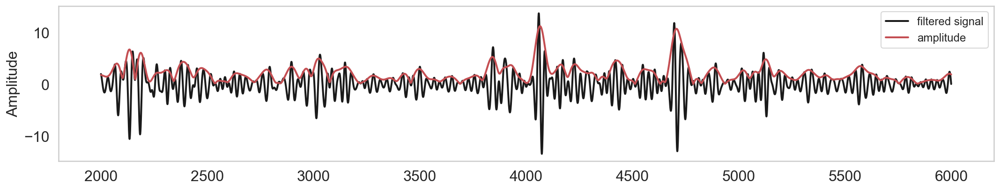

In [23]:
xlim = (2000, 6000)
tidx = np.logical_and(lfp_times_c14 >= xlim[0],lfp_times_c14 < xlim[1])

# Plot the filtered signal and oscillation amplitude
plot_instantaneous_measure(lfp_times_c14[tidx], [lfp_filt_gamma_c14[tidx], gamma_amp[tidx]],
                           measure='amplitude', lw=2, xlabel='',
                           labels=['filtered signal', 'amplitude'])

#### 3. Classify a burst as whenever the gamma analytic amplitude goes above some criterion (3x median, 2std of the mean, whatever), and ends when it drops below another criterion (1.5x mean, 1std of mean)


#### Try 3 different moethods for gamma burst classifcation
#### Method 1: My own code to detect when analytic amplitude goes above some criteria - ignore for now (slower)
#### Method 2: neurodsp burst detection on gamma filtered data
#### Method 3: neurodsp burst detection on unfiltered data 

#### Method 2

In [24]:
xlim = (1000,20000)
tidx = np.logical_and(lfp_times_c14 >= xlim[0],lfp_times_c14 < xlim[1])

In [25]:
###Try neurodsp burst detection method 
is_burst_m2 = detect_bursts_dual_threshold(lfp_filt_c14, lfp_fs, dual_thresh=(3, 1), f_range=(gamma_peak - 15, gamma_peak+15))


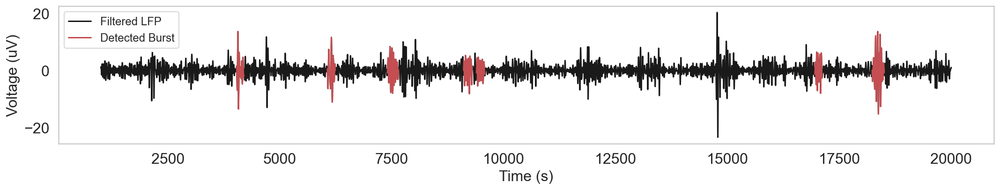

In [26]:
plot_bursts(lfp_times_c14[tidx], lfp_filt_gamma_c14[tidx], is_burst_m2[tidx], labels=['Filtered LFP', 'Detected Burst'])


In [27]:
gamma_bursts_ms_m2 = in_burst_to_burst_range_ms(is_burst_m2)


#### Method 3

In [28]:
###Try neurodsp burst detection method 
is_burst_m3 = detect_bursts_dual_threshold(lfp_filt_gamma_c14, lfp_fs, dual_thresh=(2, 1), f_range=(gamma_peak - 15, gamma_peak+15))


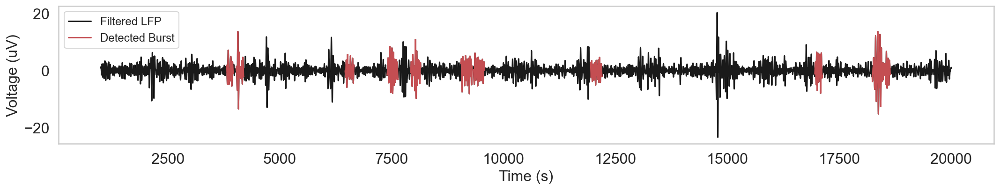

In [29]:
plot_bursts(lfp_times_c14[tidx], lfp_filt_gamma_c14[tidx], is_burst_m3[tidx], labels=['Filtered LFP', 'Detected Burst'])


In [30]:
gamma_bursts_ms_m3 = in_burst_to_burst_range_ms(is_burst_m3)

### Load and analyze extracellular spike data - IGNORE EXTRACELLULAR FOR NOW

In [31]:
"""
#load npx data
npx_file_dir = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_npx_recordings/'
npx_path = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_npx_recordings/c42npx_filt.npy'
npx_fs = 30000 # sampling rate
npx_one_ms = int(npx_fs / 1000)
npx_channels = 384
npx_patch_channel = 109"""


"\n#load npx data\nnpx_file_dir = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_npx_recordings/'\nnpx_path = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_npx_recordings/c42npx_filt.npy'\nnpx_fs = 30000 # sampling rate\nnpx_one_ms = int(npx_fs / 1000)\nnpx_channels = 384\nnpx_patch_channel = 109"

In [32]:
"""# open and load the data
npx_filt = np.load(npx_path)"""

'# open and load the data\nnpx_filt = np.load(npx_path)'

In [33]:
"""npx_times_c42 = np.arange(0, np.shape(npx_filt)[0]) / npx_one_ms # in ms instead of sec"""

'npx_times_c42 = np.arange(0, np.shape(npx_filt)[0]) / npx_one_ms # in ms instead of sec'

In [34]:
"""npx_times_c42 [-1]/60000"""

'npx_times_c42 [-1]/60000'

In [35]:
"""plt.plot(npx_filt[0:100000])"""

'plt.plot(npx_filt[0:100000])'

#### Detect extracellular spikes

In [36]:
"""sp_ex = Spike(thresh_amp=41.5, window_length=(5., 5.), smooth_frac=.01)

sp.alt(lfp_filt, lfp_fs, compute_alt_features, queue=True,
       param_keys=['stim_mean', 'stim_std'], ref='inflection', window_length=(20, 0))

sp_ex.fit(npx_filt, npx_fs, n_jobs=-1, progress=tqdm)"""

"sp_ex = Spike(thresh_amp=41.5, window_length=(5., 5.), smooth_frac=.01)\n\nsp.alt(lfp_filt, lfp_fs, compute_alt_features, queue=True,\n       param_keys=['stim_mean', 'stim_std'], ref='inflection', window_length=(20, 0))\n\nsp_ex.fit(npx_filt, npx_fs, n_jobs=-1, progress=tqdm)"

In [37]:
"""sp_ex.df_features"""

'sp_ex.df_features'

In [38]:
"""sp_ex.plot()"""

'sp_ex.plot()'

In [39]:
"""sp_ex.spike_inds"""

'sp_ex.spike_inds'

### Compute patch clamp spike features for cell 42

#### 4. compare the patched spike waveform for spikes that occur during an obvious gamma burst versus those are are obviously not in gamma. We’ll want to confirm this visually, looking at the time series as well.


In [40]:
#load patch clamp data for cell 42
patch_filt_dir = '/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/Neuropixel Paired Recordings/Recordings/filt_patch_recordings/c14patch_filt.npy'
patch_fs = 50023.88170476
patch_one_ms = int(patch_fs / 1000)

In [41]:
patch_filt = np.load(patch_filt_dir)
patch_times = np.arange(0, np.shape(patch_filt)[0]) / patch_one_ms # in ms instead of sec


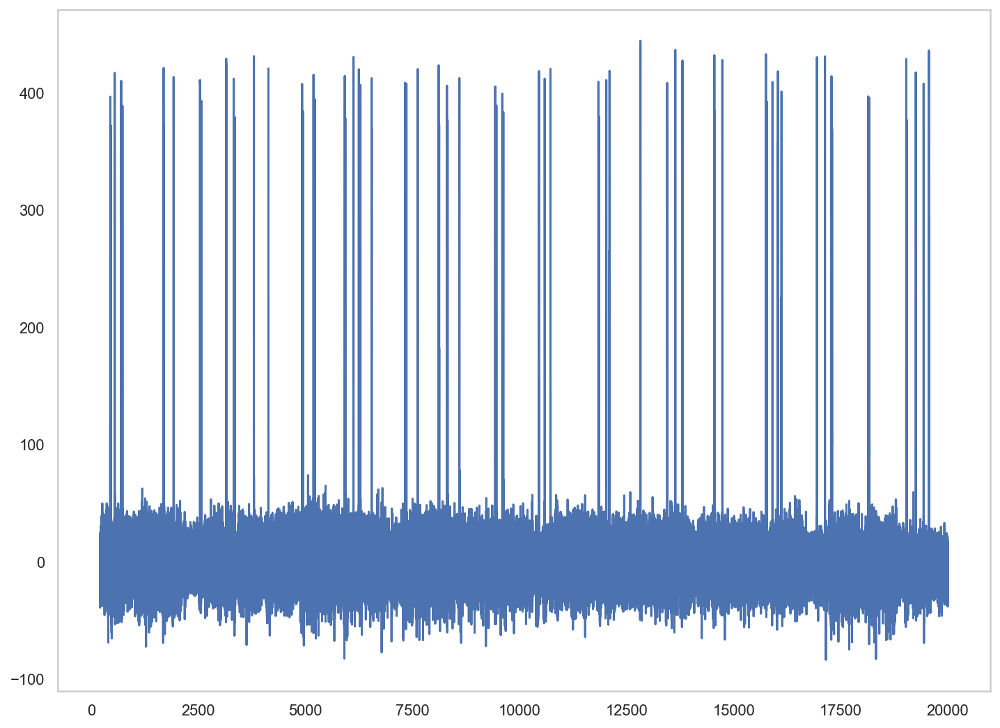

In [43]:
plt.plot(patch_times[10000:1000000], -patch_filt[10000:1000000])

In [44]:
#flip sign of patch filt
patch_filt = -patch_filt

In [46]:
def compute_alt_features(stim, fs):
    return stim.mean(), stim.std()

#threshold in mVs
sp = Spike(thresh_amp=200, window_length=(5., 5.), smooth_frac=.01)

"""sp.alt(lfp_filt_c42, lfp_fs, compute_alt_features, queue=True,
       param_keys=['stim_mean', 'stim_std'], ref='inflection', window_length=(20, 0))"""

sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm)

Spike:   0%|          | 0/25595 [00:00<?, ?it/s]

In [47]:
sp.df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,r_squared_exp
0,10.961877,0.30,18.382591,395.951470,0.62,79.815607,3.948221,-7.969183,0.000000,0.105688,0.931976
1,10.961877,0.30,18.382591,395.951470,0.62,79.815607,3.948221,-7.969183,0.000000,0.105688,0.931976
2,10.961877,0.30,18.382591,395.951470,0.62,79.815607,3.948221,-7.969183,0.000000,0.105688,0.931976
3,10.961877,0.30,18.382591,395.951470,0.62,79.815607,3.948221,-7.969183,0.000000,0.105688,0.931976
4,10.961877,0.30,18.382591,395.951470,0.62,79.815607,3.948221,-7.969183,0.000000,0.105688,0.931976
...,...,...,...,...,...,...,...,...,...,...,...
25590,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,394.631511,0.145509,0.982903
25591,5.990374,0.24,14.990355,608.117943,0.48,230.369331,2.371930,-3.591549,0.000000,0.050466,0.977489
25592,5.990374,0.24,14.990355,608.117943,0.48,230.369331,2.371930,-3.591549,0.000000,0.050466,0.977489
25593,5.990374,0.24,14.990355,608.117943,0.48,230.369331,2.371930,-3.591549,0.000000,0.050466,0.977489


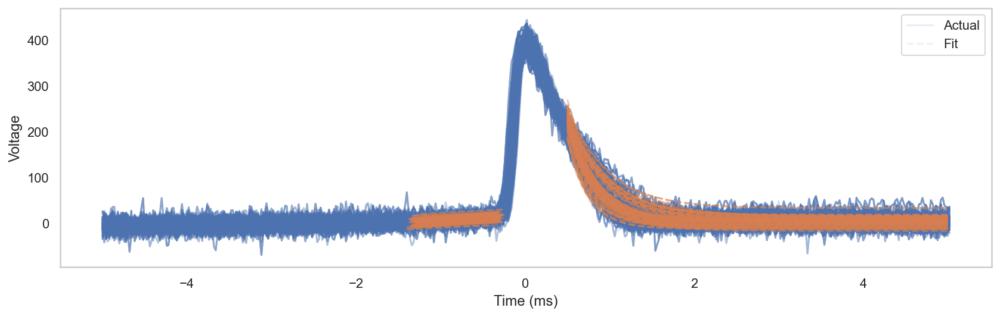

In [51]:
# First 10 fits
sp.plot(inds=np.arange(
    500), mode='full')

### Use detected spike indeces to determine if a spike occured during gamma peak or not

#### A) Get converted indices for gamma 'bursts'

In [52]:
gamma_bursts_ms_m2

[[691.0, 869.5],
 [4028.0, 4189.5],
 [6059.5, 6234.0],
 [7401.0, 7647.5],
 [9104.0, 9297.0],
 [9390.0, 9573.5],
 [16953.5, 17115.5],
 [18232.5, 18505.0],
 [21214.5, 21425.0],
 [24155.0, 24322.0],
 [26167.0, 26505.5],
 [27295.0, 27641.0],
 [28569.5, 28748.5],
 [30170.0, 30370.5],
 [32148.0, 32325.5],
 [33443.5, 33601.5],
 [39054.5, 39241.5],
 [40121.0, 40396.5],
 [42968.5, 43149.5],
 [45035.0, 45246.0],
 [47117.0, 47281.0],
 [50560.5, 50783.5],
 [50796.0, 50998.5],
 [51297.5, 51483.0],
 [52500.0, 52663.5],
 [52990.0, 53163.0],
 [57123.0, 57280.0],
 [58254.0, 58493.5],
 [60029.5, 60242.0],
 [62427.5, 62664.0],
 [63393.5, 63567.5],
 [65205.0, 65417.5],
 [67822.5, 67980.5],
 [69393.0, 69616.5],
 [69645.0, 69941.5],
 [71056.5, 71227.5],
 [74269.0, 74448.0],
 [74559.5, 74838.0],
 [76314.5, 76537.5],
 [78024.0, 78187.5],
 [82392.0, 82722.5],
 [84135.5, 84553.0],
 [85230.0, 85429.0],
 [86600.5, 86814.0],
 [87141.0, 87319.0],
 [90393.0, 90586.0],
 [90865.5, 91056.0],
 [92333.0, 92543.5],
 [9351

In [53]:
gamma_bursts_ms_m3

[[111.0, 269.0],
 [689.0, 874.5],
 [3806.0, 3958.5],
 [4022.5, 4187.5],
 [6457.5, 6656.5],
 [7396.5, 7638.0],
 [7923.0, 8145.0],
 [9042.5, 9296.5],
 [9326.5, 9569.0],
 [11944.0, 12197.0],
 [16953.5, 17119.0],
 [18235.0, 18637.5],
 [20867.0, 21040.0],
 [21064.5, 21437.5],
 [24165.5, 24325.0],
 [26166.0, 26501.0],
 [27297.0, 27646.5],
 [27673.5, 27827.0],
 [30169.0, 30371.5],
 [31718.5, 32030.0],
 [32092.5, 32330.5],
 [33684.5, 33846.5],
 [39049.0, 39247.0],
 [39266.5, 39439.5],
 [40118.0, 40287.0],
 [41682.5, 41834.5],
 [45032.0, 45365.0],
 [46863.5, 47077.5],
 [47119.5, 47279.5],
 [50626.0, 50784.5],
 [50802.0, 51005.0],
 [51293.0, 51483.5],
 [52500.0, 52665.0],
 [52679.0, 52869.0],
 [52884.5, 53153.5],
 [54375.5, 54582.0],
 [55886.0, 56064.0],
 [56915.5, 57278.0],
 [57313.0, 57518.5],
 [60027.5, 60242.0],
 [62421.5, 62665.5],
 [63390.0, 63568.0],
 [63877.5, 64067.5],
 [65207.0, 65421.0],
 [67434.5, 67591.5],
 [67820.5, 67976.0],
 [69382.0, 69618.0],
 [69641.0, 69946.5],
 [71061.5, 712

#### B) Get converted indices for lowest amp no gamma 'bursts'. Select areas not in bursts with the lowest analytic amplitude

In [54]:
ranges_not_burst_m2 = in_burst_to_burst_range_ms(np.invert(is_burst_m2), ms_convert=False)
ranges_not_burst_m3 = in_burst_to_burst_range_ms(np.invert(is_burst_m3), ms_convert=False)

#### Select ranges with lowest analytical amplitude 

In [55]:
not_burst_ms_m2 = get_lowest_analytical_amp(gamma_amp,ranges_not_burst_m2, lfp_one_ms)
not_burst_ms_m3 = get_lowest_analytical_amp(gamma_amp,ranges_not_burst_m3, lfp_one_ms)

#### Visualize regions in gamma burst and low amp no gamma 

##### Gamma detection method 2

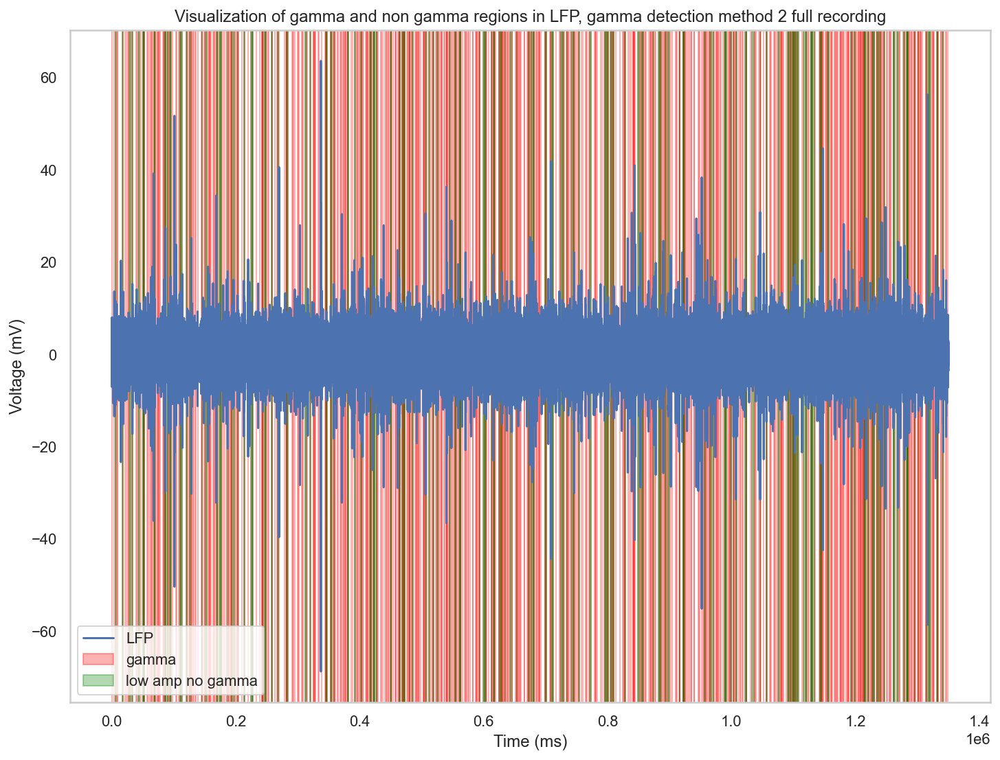

In [56]:
visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m2, not_burst_ms_m2, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 2', xlim=None)



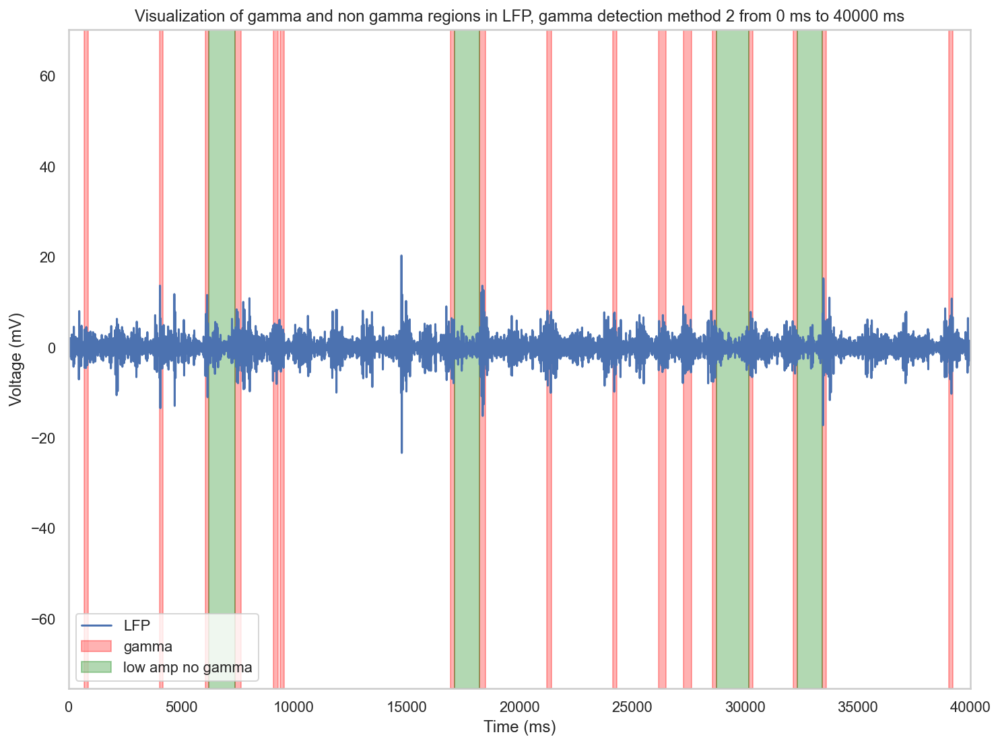

In [57]:
visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m2, not_burst_ms_m2, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 2', xlim=(0,40000))



###### Gamma detection method 3

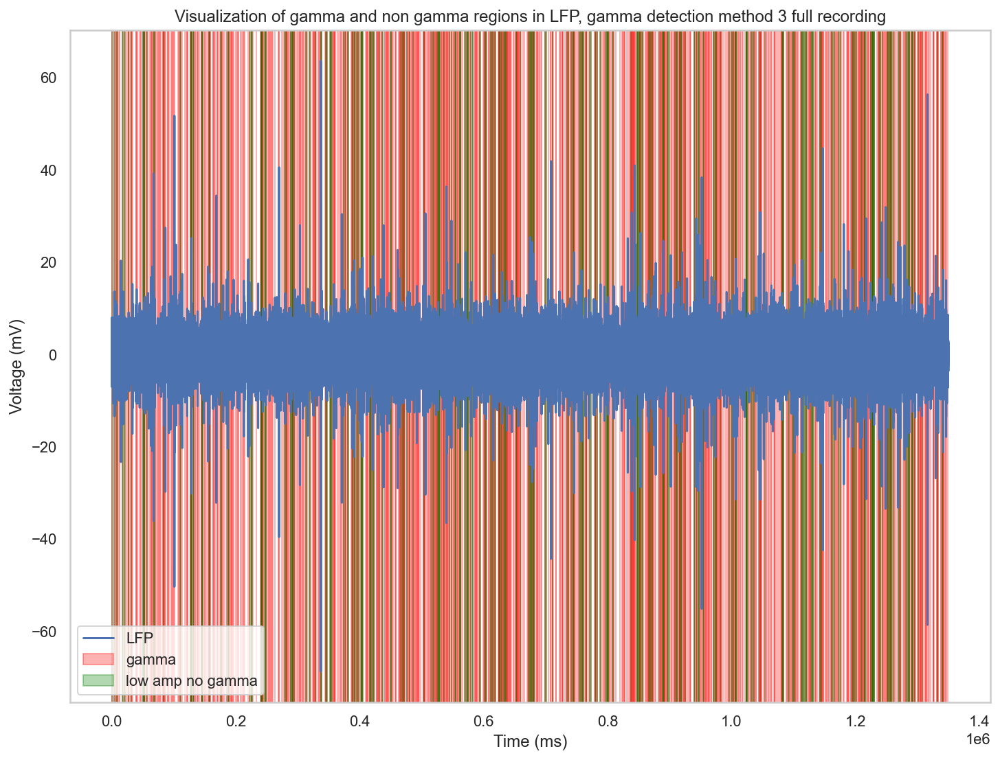

In [58]:
visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m3, not_burst_ms_m3, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 3', xlim=None)



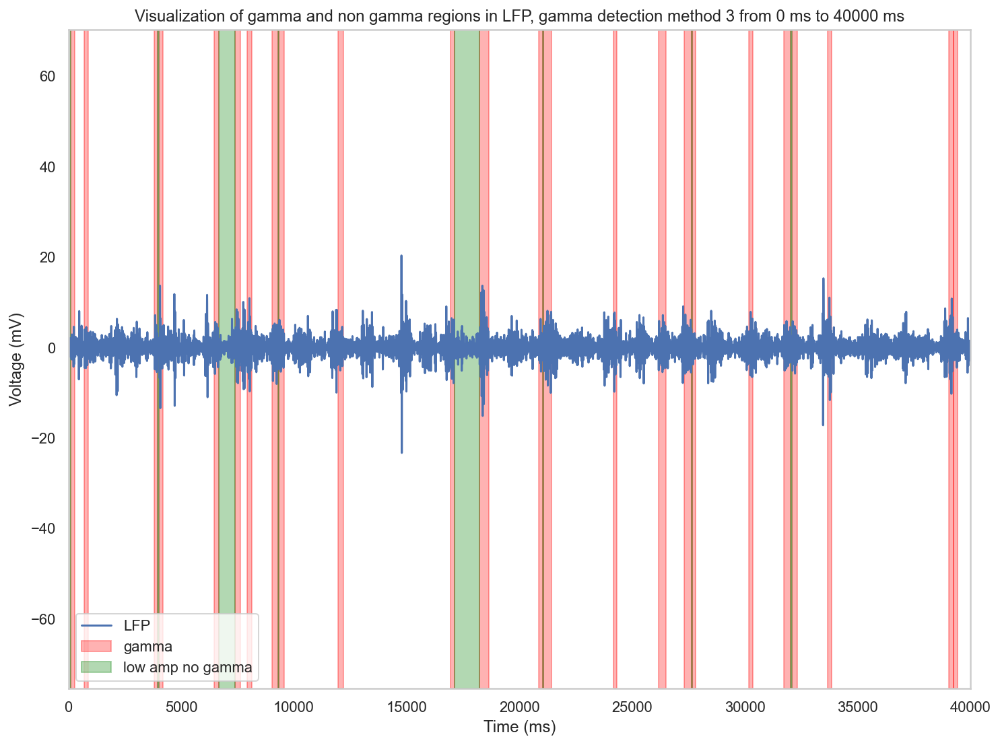

In [59]:
visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m3, not_burst_ms_m3, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 3', xlim=(0,40000))



#### C) Determine what spikes are in which group 

In [60]:
spk_times_ms = patch_times_c14[sp.spike_inds]

In [61]:
spk_class_m2, spk_idx_m2, spk_idx_ms_m2 =  spk_lfp_class(spk_times_ms, not_burst_ms_m2, gamma_bursts_ms_m2)

spk_class_m3, spk_idx_m3, spk_idx_ms_m3 =  spk_lfp_class(spk_times_ms, not_burst_ms_m3, gamma_bursts_ms_m3)


In [62]:
occurrence_m2 = {item: spk_class_m2.count(item) for item in spk_class_m2}
occurrence_m3 = {item: spk_class_m3.count(item) for item in spk_class_m3}

In [63]:
occurrence_m2

{'gamma': 3044, 'no_gamma': 3234}

In [64]:
occurrence_m3

{'gamma': 4345, 'no_gamma': 2443}

#### E) Compare features of gamma and no gamma spikes

In [65]:
#Get features for gamma spikes
idx_gamma_m2 = np.where(np.array(spk_class_m2) == 'gamma')[0]
#get spike_idx 
spk_idx_gamma_m2 = np.asarray(spk_idx_m2)[np.asarray(idx_gamma_m2)]
spk_gamma_features_m2 = sp.df_features.iloc[spk_idx_gamma_m2]

In [66]:
#Get features for gamma spikes
idx_gamma_m3 = np.where(np.array(spk_class_m3) == 'gamma')[0]
#get spike_idx 
spk_idx_gamma_m3 = np.asarray(spk_idx_m3)[np.asarray(idx_gamma_m3)]
spk_gamma_features_m3 = sp.df_features.iloc[spk_idx_gamma_m3]

In [67]:
#Get features for no gamma spikes
idx_no_gamma_m2 = np.where(np.array(spk_class_m2) == 'no_gamma')[0]
#get spike_idx 
spk_idx_no_gamma_m2 = np.asarray(spk_idx_m2)[np.asarray(idx_no_gamma_m2)]
spk_no_gamma_features_m2 = sp.df_features.iloc[spk_idx_no_gamma_m2]

In [68]:
#Get features for no gamma spikes
idx_no_gamma_m3 = np.where(np.array(spk_class_m3) == 'no_gamma')[0]
#get spike_idx 
spk_idx_no_gamma_m3 = np.asarray(spk_idx_m3)[np.asarray(idx_no_gamma_m3)]
spk_no_gamma_features_m3 = sp.df_features.iloc[spk_idx_no_gamma_m3]

#### Visualize categorized spikes and LFP groups


In [69]:
gamma_spks_m2 = np.asarray(spk_idx_ms_m2)[np.asarray(idx_gamma_m2)]
no_gamma_spks_m2 = np.asarray(spk_idx_ms_m2)[np.asarray(idx_no_gamma_m2)]

gamma_spks_m3 = np.asarray(spk_idx_ms_m3)[np.asarray(idx_gamma_m3)]
no_gamma_spks_m3 = np.asarray(spk_idx_ms_m3)[np.asarray(idx_no_gamma_m3)]

###### Method 2

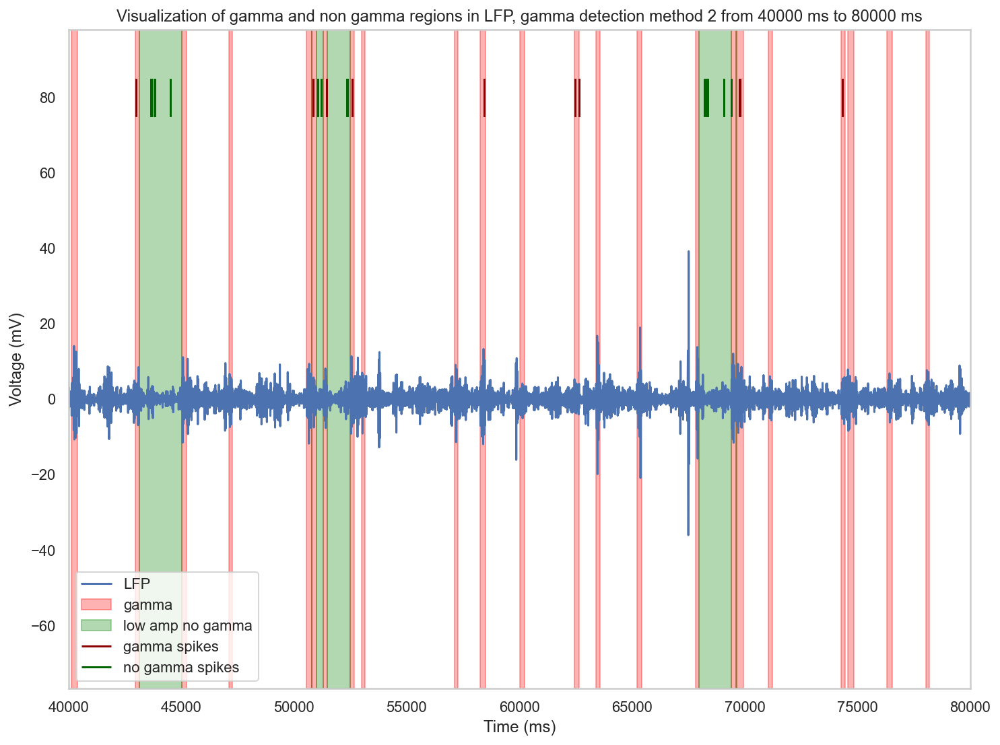

In [70]:

visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m2, not_burst_ms_m2, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 2', xlim=(40000,80000), plot_spk=True, spk_gamma= gamma_spks_m2, spk_nogamma=no_gamma_spks_m2)


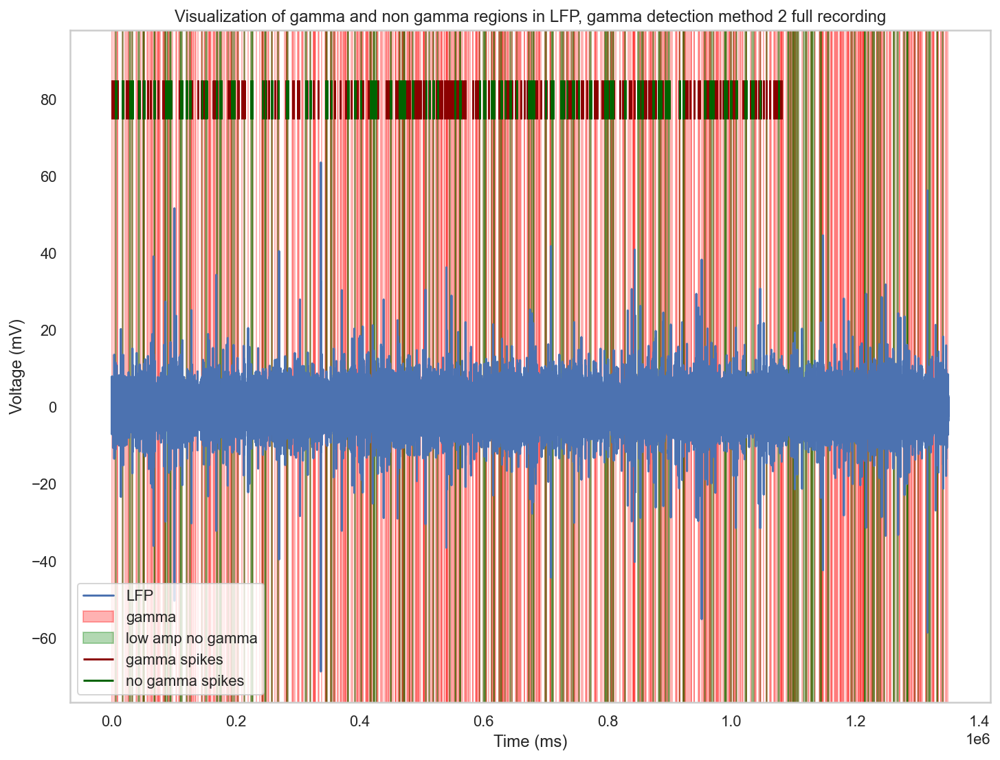

In [71]:

visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m2, not_burst_ms_m2, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 2', plot_spk=True, spk_gamma= gamma_spks_m2, spk_nogamma=no_gamma_spks_m2)


##### Method 3

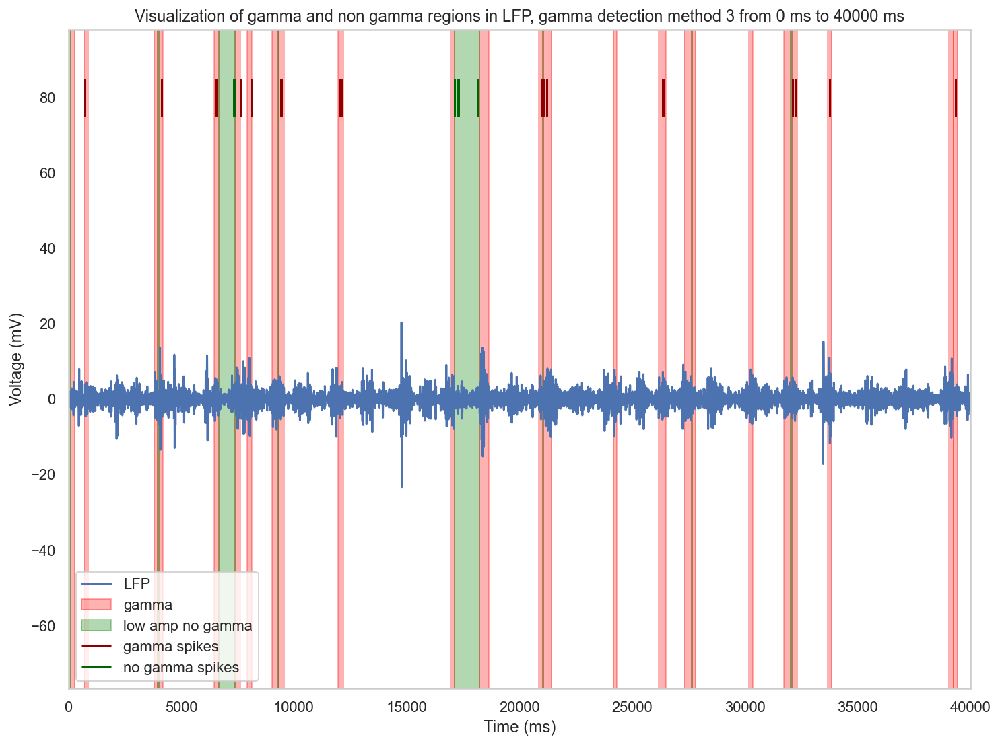

In [72]:
visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m3, not_burst_ms_m3, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 3', xlim=(0,40000), plot_spk=True, spk_gamma= gamma_spks_m3, spk_nogamma=no_gamma_spks_m3)


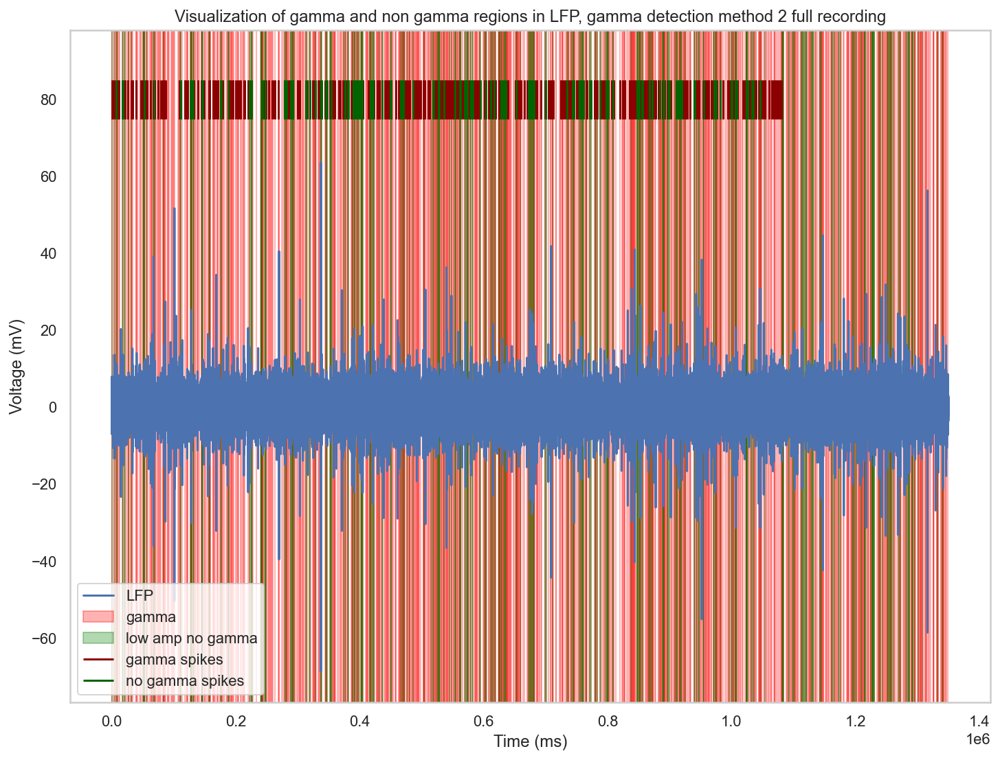

In [73]:

visualize_lfp_gamma_regions(lfp_times_c14, lfp_filt_gamma_c14, gamma_bursts_ms_m3, not_burst_ms_m3, 
                            title = 'Visualization of gamma and non gamma regions in LFP, gamma detection method 2', plot_spk=True, spk_gamma= gamma_spks_m3, spk_nogamma=no_gamma_spks_m3)


##### Gamma features

In [74]:
spk_gamma_features_m2

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,r_squared_exp
21,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
22,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
23,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
24,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
25,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,31.025181,0.203775,0.951483
...,...,...,...,...,...,...,...,...,...,...,...
25586,21.334144,0.24,34.382807,642.778547,0.46,256.968232,1.976378,15.565057,50.815729,0.441055,0.984444
25587,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,0.000000,0.145509,0.982903
25588,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,0.000000,0.145509,0.982903
25589,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,0.000000,0.145509,0.982903


In [75]:
spk_gamma_features_m3

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,r_squared_exp
21,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
22,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
23,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
24,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,0.000000,0.203775,0.951483
25,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,31.025181,0.203775,0.951483
...,...,...,...,...,...,...,...,...,...,...,...
25586,21.334144,0.24,34.382807,642.778547,0.46,256.968232,1.976378,15.565057,50.815729,0.441055,0.984444
25587,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,0.000000,0.145509,0.982903
25588,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,0.000000,0.145509,0.982903
25589,11.457567,0.24,22.811053,599.141551,0.46,239.975334,1.980195,14.101782,0.000000,0.145509,0.982903


#### Plot gamma features

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


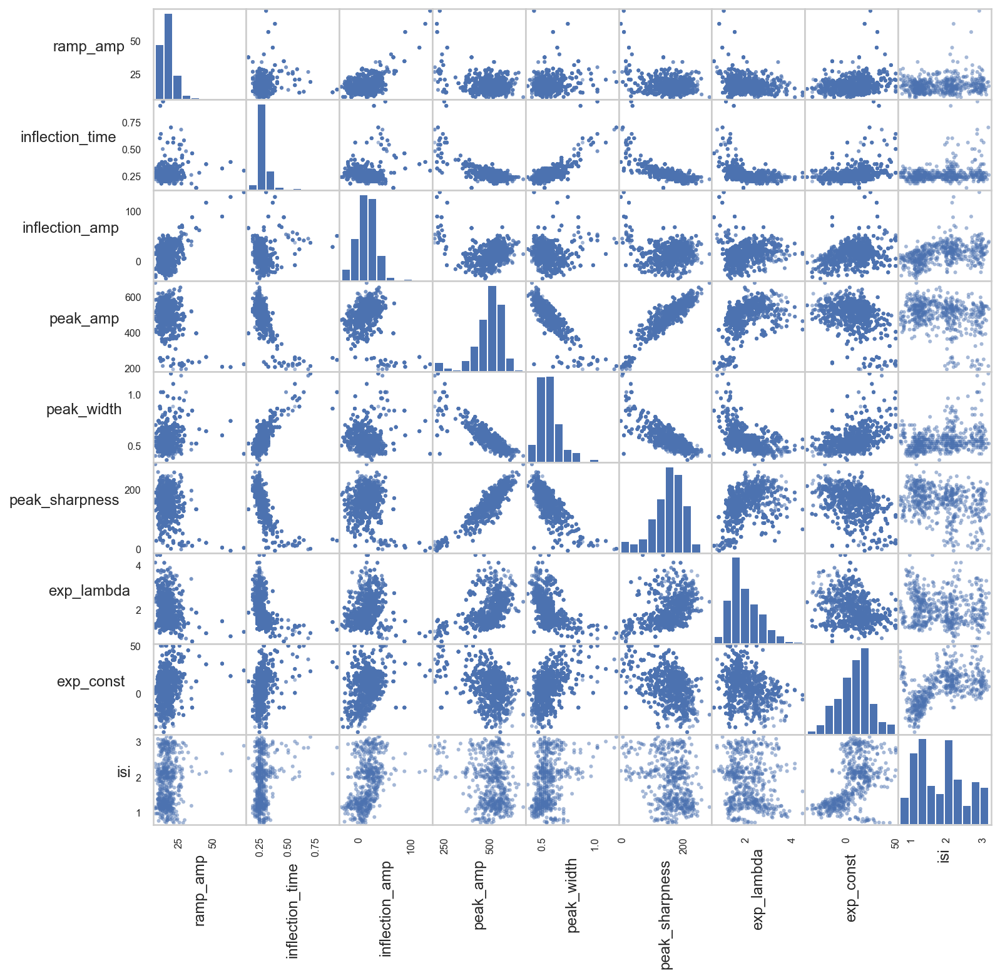

In [76]:


# Ensure inflection times are between 0 and 2 ms
df_drop_gamma_m2 = spk_gamma_features_m2.loc[spk_gamma_features_m2['inflection_time'] > 0.]
df_drop_gamma_m2 = df_drop_gamma_m2.loc[df_drop_gamma_m2['inflection_time'] < 2.]

# Remove low r-squares (ramping fits are especially noisy)
df_drop_gamma_m2 = df_drop_gamma_m2.loc[df_drop_gamma_m2['r_squared_exp']  >= .5]
df_drop_gamma_m2 = df_drop_gamma_m2.loc[df_drop_gamma_m2['r_squared_ramp'] >= .1]

# log10 ISIs
df_drop_gamma_m2[['isi']] = np.log10(df_drop_gamma_m2[['isi']])

# drop no-longer-used QC features
df_drop_gamma_m2 = df_drop_gamma_m2.drop(['r_squared_exp', 'r_squared_ramp'], axis=1)
#replace infs with NaN
df_drop_gamma_m2 = df_drop_gamma_m2.replace([np.inf, -np.inf], np.nan)

# Rotate labels
axes = pd.plotting.scatter_matrix(df_drop_gamma_m2, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

#### zscore outlier removal

In [77]:
df_drop_gamma_m2_outliers = df_drop_gamma_m2[(np.abs(stats.zscore(df_drop_gamma_m2, nan_policy='omit')) < 3).all(axis=1)]


In [164]:
df_drop_gamma_m2_outliers['ramp_amp']

25       18.679983
30       27.569676
142      13.057563
177      12.255912
559      11.556059
           ...    
25490    22.639853
25499    22.374541
25502    25.873381
25586    21.334144
25590    11.457567
Name: ramp_amp, Length: 514, dtype: float64

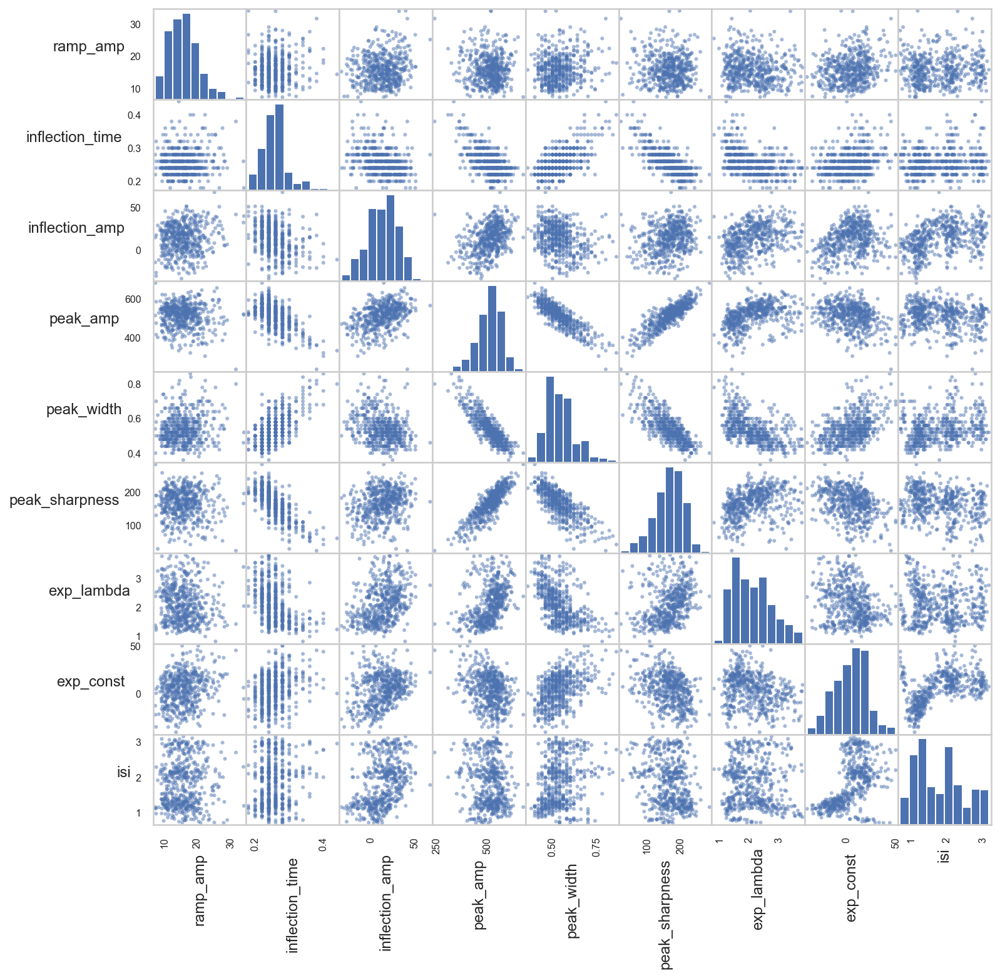

In [78]:
# plot
axes = pd.plotting.scatter_matrix(df_drop_gamma_m2_outliers, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

#### Plot spike shapes gamma method 2 

In [133]:
sp.plot(inds = df_drop_gamma_m2_outliers.index[:100], show_points=True)

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large 

ValueError: Image size of 1690x79778 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1008x288 with 1 Axes>

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


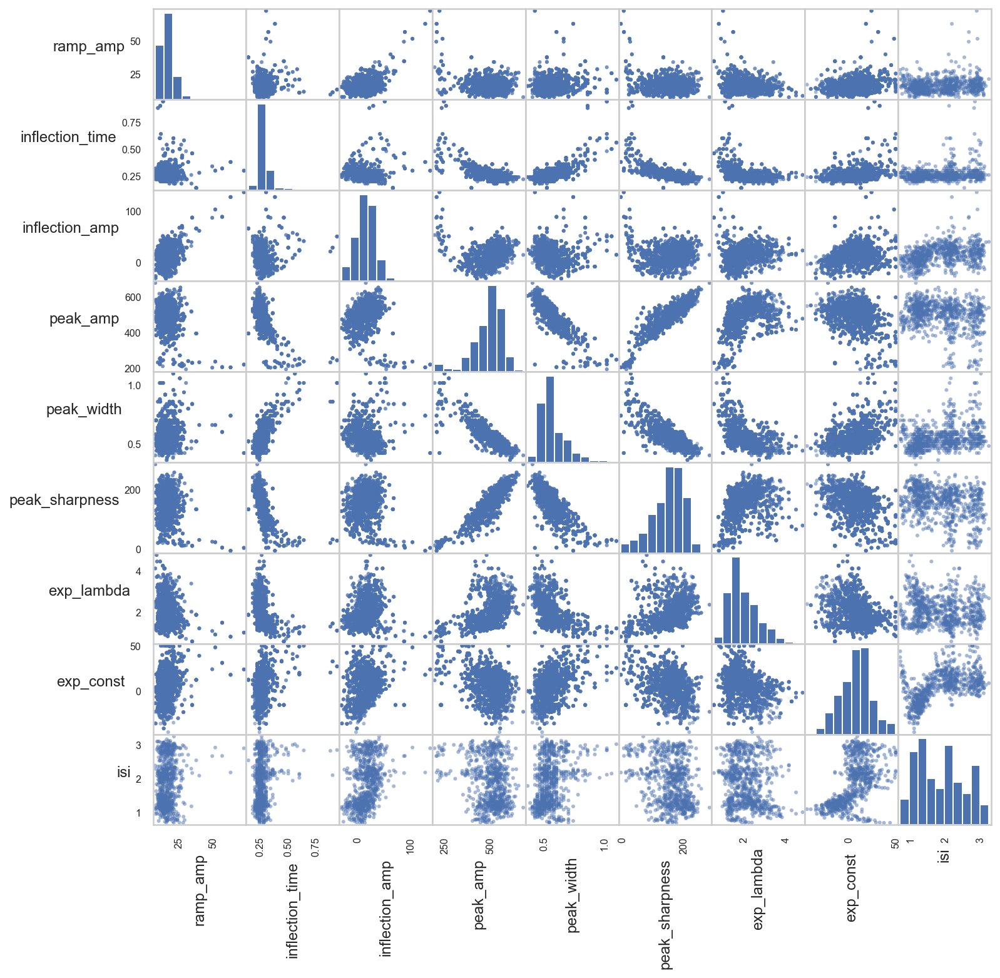

In [80]:


# Ensure inflection times are between 0 and 2 ms
df_drop_gamma_m3 = spk_gamma_features_m3.loc[spk_gamma_features_m3['inflection_time'] > 0.]
df_drop_gamma_m3 = df_drop_gamma_m3.loc[df_drop_gamma_m3['inflection_time'] < 2.]

# Remove low r-squares (ramping fits are especially noisy)
df_drop_gamma_m3 = df_drop_gamma_m3.loc[df_drop_gamma_m3['r_squared_exp']  >= .5]
df_drop_gamma_m3 = df_drop_gamma_m3.loc[df_drop_gamma_m3['r_squared_ramp'] >= .1]

# log10 ISIs
df_drop_gamma_m3[['isi']] = np.log10(df_drop_gamma_m3[['isi']])

# drop no-longer-used QC features
df_drop_gamma_m3 = df_drop_gamma_m3.drop(['r_squared_exp', 'r_squared_ramp'], axis=1)
#replace infs with NaN
df_drop_gamma_m3 = df_drop_gamma_m3.replace([np.inf, -np.inf], np.nan)

# Rotate labels
axes = pd.plotting.scatter_matrix(df_drop_gamma_m3, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

In [81]:
df_drop_gamma_m3_outliers = df_drop_gamma_m3[(np.abs(stats.zscore(df_drop_gamma_m3, nan_policy='omit')) < 3).all(axis=1)]


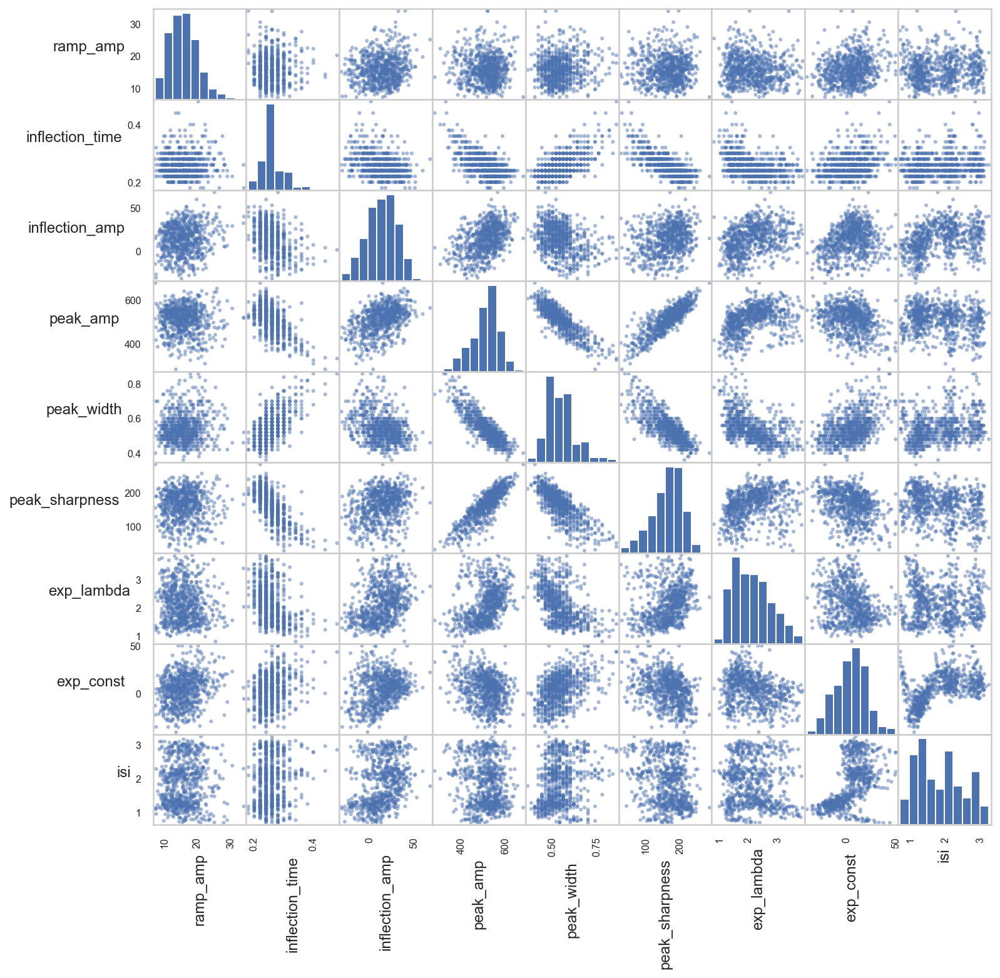

In [82]:
# plot
axes = pd.plotting.scatter_matrix(df_drop_gamma_m3_outliers, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

In [83]:
sp.plot(inds = df_drop_gamma_m3_outliers.index, show_points=True)

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large 

ValueError: Image size of 1690x113413 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1008x288 with 1 Axes>

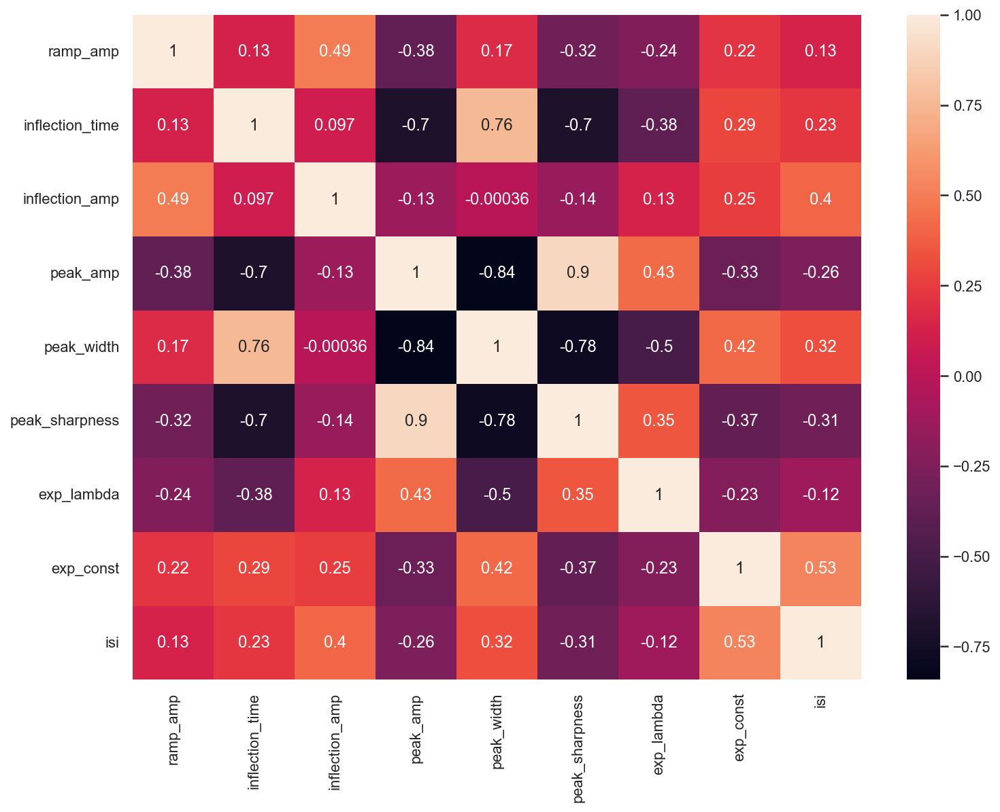

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.13***,0.49***,-0.38***,0.17***,-0.32***,-0.24***,0.22***,0.13**
inflection_time,0.13***,1.0***,0.1***,-0.7***,0.76***,-0.7***,-0.38***,0.29***,0.23***
inflection_amp,0.49***,0.1***,1.0***,-0.13***,-0.0,-0.14***,0.13***,0.25***,0.4***
peak_amp,-0.38***,-0.7***,-0.13***,1.0***,-0.84***,0.9***,0.43***,-0.33***,-0.26***
peak_width,0.17***,0.76***,-0.0,-0.84***,1.0***,-0.78***,-0.5***,0.42***,0.32***
peak_sharpness,-0.32***,-0.7***,-0.14***,0.9***,-0.78***,1.0***,0.35***,-0.37***,-0.31***
exp_lambda,-0.24***,-0.38***,0.13***,0.43***,-0.5***,0.35***,1.0***,-0.23***,-0.12**
exp_const,0.22***,0.29***,0.25***,-0.33***,0.42***,-0.37***,-0.23***,1.0***,0.53***
isi,0.13**,0.23***,0.4***,-0.26***,0.32***,-0.31***,-0.12**,0.53***,1.0***


In [84]:
spikes_corr_gamma_m2 = df_drop_gamma_m2.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_gamma_m2, xticklabels=spikes_corr_gamma_m2.columns, 
            yticklabels=spikes_corr_gamma_m2.columns, annot=True)
plt.show()

rho = df_drop_gamma_m2.corr()
pval = df_drop_gamma_m2.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

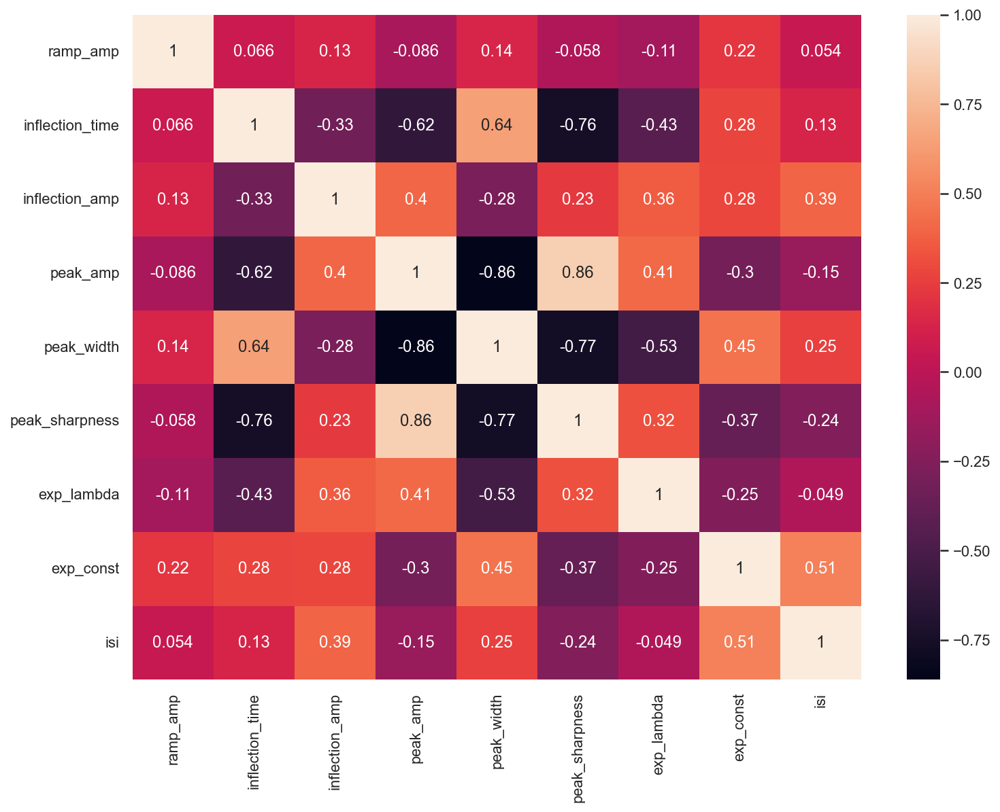

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.07,0.13**,-0.09,0.14**,-0.06,-0.11*,0.22***,0.05
inflection_time,0.07,1.0***,-0.33***,-0.62***,0.64***,-0.76***,-0.43***,0.28***,0.13**
inflection_amp,0.13**,-0.33***,1.0***,0.4***,-0.28***,0.23***,0.36***,0.28***,0.39***
peak_amp,-0.09,-0.62***,0.4***,1.0***,-0.86***,0.86***,0.41***,-0.3***,-0.15***
peak_width,0.14**,0.64***,-0.28***,-0.86***,1.0***,-0.77***,-0.53***,0.45***,0.25***
peak_sharpness,-0.06,-0.76***,0.23***,0.86***,-0.77***,1.0***,0.32***,-0.37***,-0.24***
exp_lambda,-0.11*,-0.43***,0.36***,0.41***,-0.53***,0.32***,1.0***,-0.25***,-0.05
exp_const,0.22***,0.28***,0.28***,-0.3***,0.45***,-0.37***,-0.25***,1.0***,0.51***
isi,0.05,0.13**,0.39***,-0.15***,0.25***,-0.24***,-0.05,0.51***,1.0***


In [85]:
spikes_corr_gamma_m2_outliers = df_drop_gamma_m2_outliers.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_gamma_m2_outliers, xticklabels=spikes_corr_gamma_m2_outliers.columns, 
            yticklabels=spikes_corr_gamma_m2_outliers, annot=True)
plt.show()

rho =  df_drop_gamma_m2_outliers.corr()
pval =  df_drop_gamma_m2_outliers.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

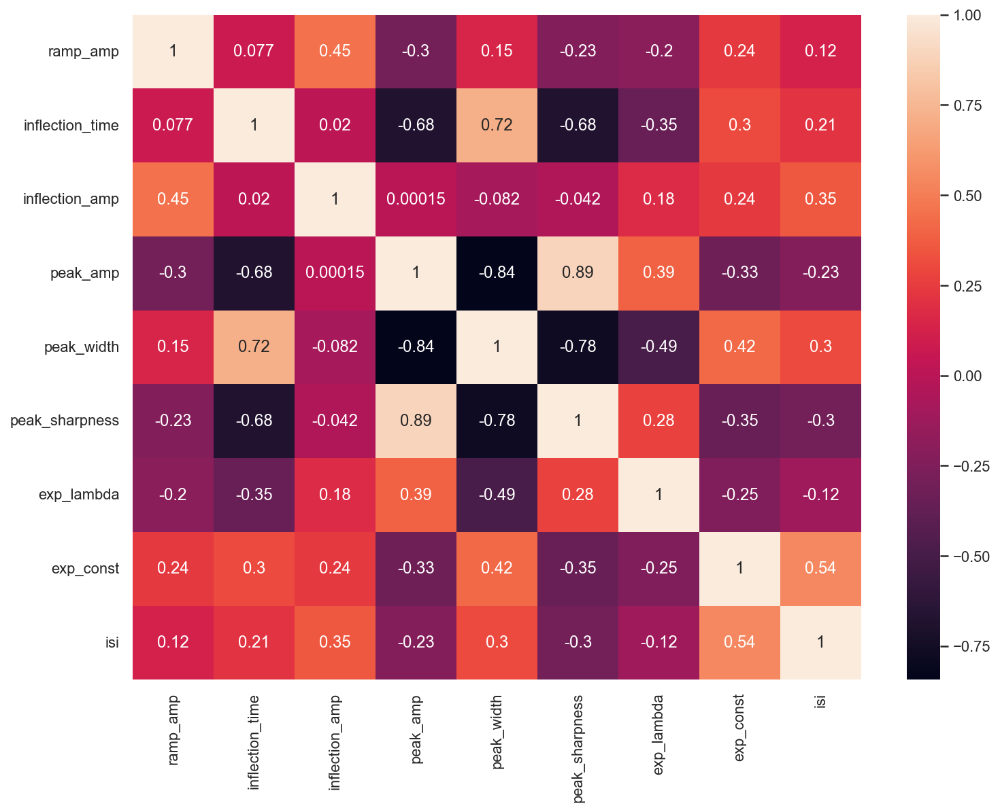

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.08***,0.45***,-0.3***,0.15***,-0.23***,-0.2***,0.24***,0.12***
inflection_time,0.08***,1.0***,0.02,-0.68***,0.72***,-0.68***,-0.35***,0.3***,0.21***
inflection_amp,0.45***,0.02,1.0***,0.0,-0.08***,-0.04*,0.18***,0.24***,0.35***
peak_amp,-0.3***,-0.68***,0.0,1.0***,-0.84***,0.89***,0.39***,-0.33***,-0.23***
peak_width,0.15***,0.72***,-0.08***,-0.84***,1.0***,-0.78***,-0.49***,0.42***,0.3***
peak_sharpness,-0.23***,-0.68***,-0.04*,0.89***,-0.78***,1.0***,0.28***,-0.35***,-0.3***
exp_lambda,-0.2***,-0.35***,0.18***,0.39***,-0.49***,0.28***,1.0***,-0.25***,-0.12***
exp_const,0.24***,0.3***,0.24***,-0.33***,0.42***,-0.35***,-0.25***,1.0***,0.54***
isi,0.12***,0.21***,0.35***,-0.23***,0.3***,-0.3***,-0.12***,0.54***,1.0***


In [86]:
spikes_corr_gamma_m3 = df_drop_gamma_m3.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_gamma_m3, xticklabels=spikes_corr_gamma_m3.columns, 
            yticklabels=spikes_corr_gamma_m3.columns, annot=True)
plt.show()

rho = df_drop_gamma_m3.corr()
pval = df_drop_gamma_m3.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

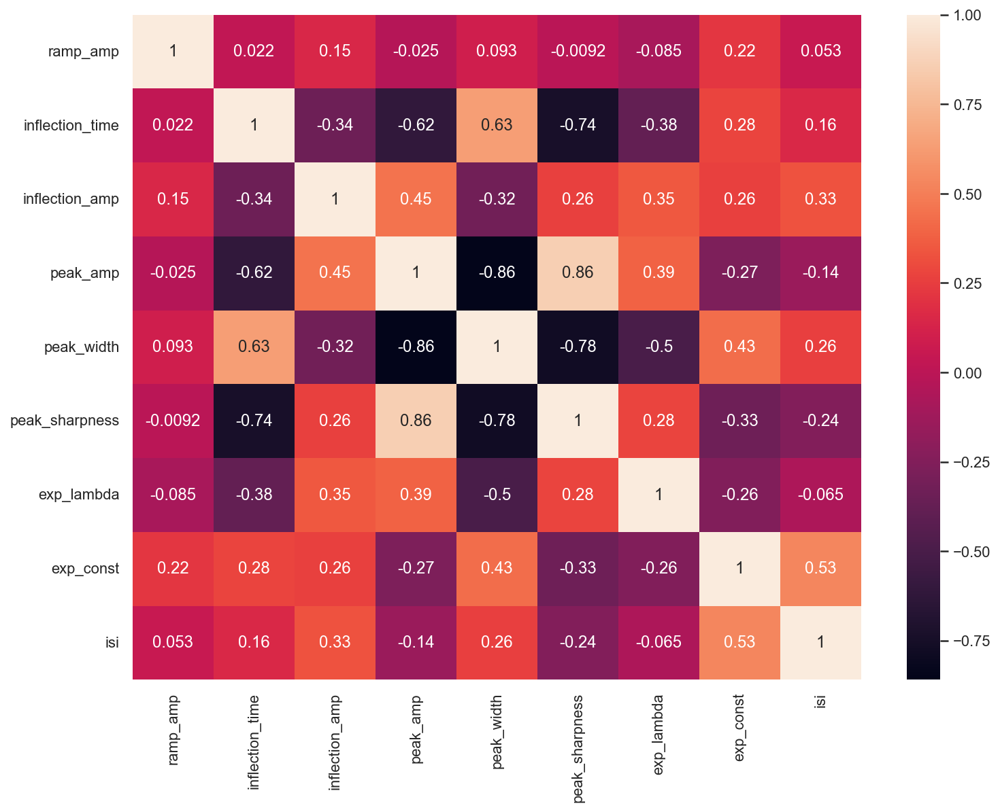

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.02,0.15***,-0.03,0.09*,-0.01,-0.08*,0.22***,0.05
inflection_time,0.02,1.0***,-0.34***,-0.62***,0.63***,-0.74***,-0.38***,0.28***,0.16***
inflection_amp,0.15***,-0.34***,1.0***,0.45***,-0.32***,0.26***,0.35***,0.26***,0.33***
peak_amp,-0.03,-0.62***,0.45***,1.0***,-0.86***,0.86***,0.39***,-0.27***,-0.14***
peak_width,0.09*,0.63***,-0.32***,-0.86***,1.0***,-0.78***,-0.5***,0.43***,0.26***
peak_sharpness,-0.01,-0.74***,0.26***,0.86***,-0.78***,1.0***,0.28***,-0.33***,-0.24***
exp_lambda,-0.08*,-0.38***,0.35***,0.39***,-0.5***,0.28***,1.0***,-0.26***,-0.06
exp_const,0.22***,0.28***,0.26***,-0.27***,0.43***,-0.33***,-0.26***,1.0***,0.53***
isi,0.05,0.16***,0.33***,-0.14***,0.26***,-0.24***,-0.06,0.53***,1.0***


In [87]:
spikes_corr_gamma_m3_outliers = df_drop_gamma_m3_outliers.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_gamma_m3_outliers, xticklabels=spikes_corr_gamma_m3_outliers.columns, 
            yticklabels=spikes_corr_gamma_m3_outliers, annot=True)
plt.show()

rho =  df_drop_gamma_m3_outliers.corr()
pval =  df_drop_gamma_m3_outliers.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

##### No gamma features

In [88]:
spk_no_gamma_features_m2

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,r_squared_exp
143,9.222089,0.34,23.211127,393.906115,0.64,31.466322,3.150828,-4.731607,0.000000,0.072103,0.927853
144,9.222089,0.34,23.211127,393.906115,0.64,31.466322,3.150828,-4.731607,0.000000,0.072103,0.927853
145,9.222089,0.34,23.211127,393.906115,0.64,31.466322,3.150828,-4.731607,0.000000,0.072103,0.927853
146,9.222089,0.34,23.211127,393.906115,0.64,31.466322,3.150828,-4.731607,0.000000,0.072103,0.927853
147,9.222089,0.34,23.211127,393.906115,0.64,31.466322,3.150828,-4.731607,0.000000,0.072103,0.927853
...,...,...,...,...,...,...,...,...,...,...,...
25477,20.655254,0.26,1.349417,471.396537,0.56,161.385371,1.511226,20.370685,0.000000,0.410204,0.969065
25478,20.655254,0.26,1.349417,471.396537,0.56,161.385371,1.511226,20.370685,6.736782,0.410204,0.969065
25479,21.168392,0.62,51.405285,202.248656,1.06,16.256531,0.691562,12.320187,0.000000,0.398842,0.966798
25480,21.168392,0.62,51.405285,202.248656,1.06,16.256531,0.691562,12.320187,0.000000,0.398842,0.966798


In [89]:
spk_no_gamma_features_m3

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,r_squared_exp
161,12.040087,0.24,37.797713,395.416008,0.56,101.218348,2.965589,-10.838193,0.000000,0.166646,0.954721
162,12.040087,0.24,37.797713,395.416008,0.56,101.218348,2.965589,-10.838193,0.000000,0.166646,0.954721
163,12.040087,0.24,37.797713,395.416008,0.56,101.218348,2.965589,-10.838193,0.000000,0.166646,0.954721
164,12.040087,0.24,37.797713,395.416008,0.56,101.218348,2.965589,-10.838193,32.684389,0.166646,0.954721
165,20.859305,0.28,35.352987,406.152474,0.62,63.050121,2.477964,9.440960,0.000000,0.285277,0.940409
...,...,...,...,...,...,...,...,...,...,...,...
24650,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,0.000000,0.229831,0.973410
24651,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,0.000000,0.229831,0.973410
24652,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,0.000000,0.229831,0.973410
24653,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,0.000000,0.229831,0.973410


/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


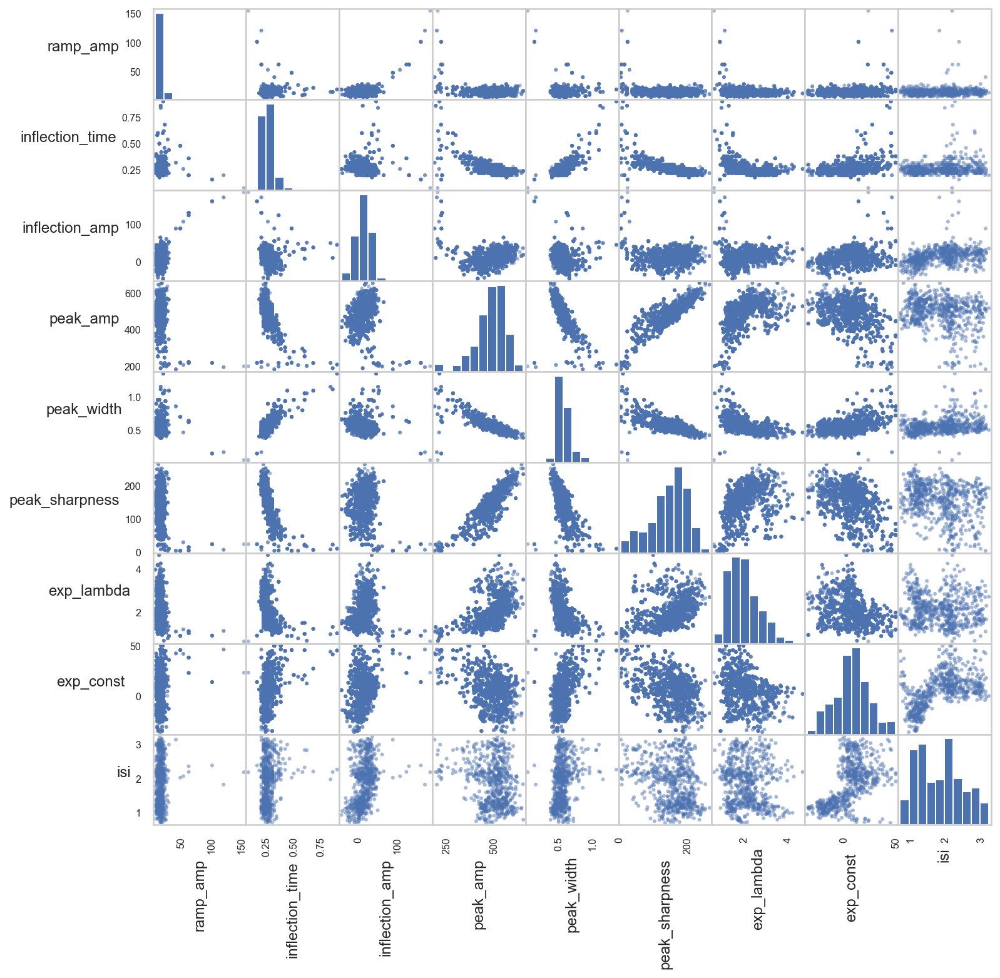

In [90]:
# Ensure inflection times are between 0 and 2 ms
df_drop_no_gamma_m2 = spk_no_gamma_features_m2.loc[spk_no_gamma_features_m2['inflection_time'] > 0.]
df_drop_no_gamma_m2 = df_drop_no_gamma_m2.loc[df_drop_no_gamma_m2['inflection_time'] < 2.]

# Remove low r-squares (ramping fits are especially noisy)
df_drop_no_gamma_m2 = df_drop_no_gamma_m2.loc[df_drop_no_gamma_m2['r_squared_exp']  >= .5]
df_drop_no_gamma_m2 = df_drop_no_gamma_m2.loc[df_drop_no_gamma_m2['r_squared_ramp'] >= .1]

# log10 ISIs
df_drop_no_gamma_m2[['isi']] = np.log10(df_drop_no_gamma_m2[['isi']])

# drop no-longer-used QC features
df_drop_no_gamma_m2 = df_drop_no_gamma_m2.drop(['r_squared_exp', 'r_squared_ramp'], axis=1)
#replace infs with NaN
df_drop_no_gamma_m2 = df_drop_no_gamma_m2.replace([np.inf, -np.inf], np.nan)

# Rotate labels
axes = pd.plotting.scatter_matrix(df_drop_no_gamma_m2, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

In [91]:
df_drop_no_gamma_m2_outliers = df_drop_no_gamma_m2[(np.abs(stats.zscore(df_drop_no_gamma_m2, nan_policy='omit')) < 3).all(axis=1)]


In [92]:
sp.plot(inds = df_drop_no_gamma_m2_outliers.index, show_points=True)

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large 

ValueError: Image size of 1690x92803 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1008x288 with 1 Axes>

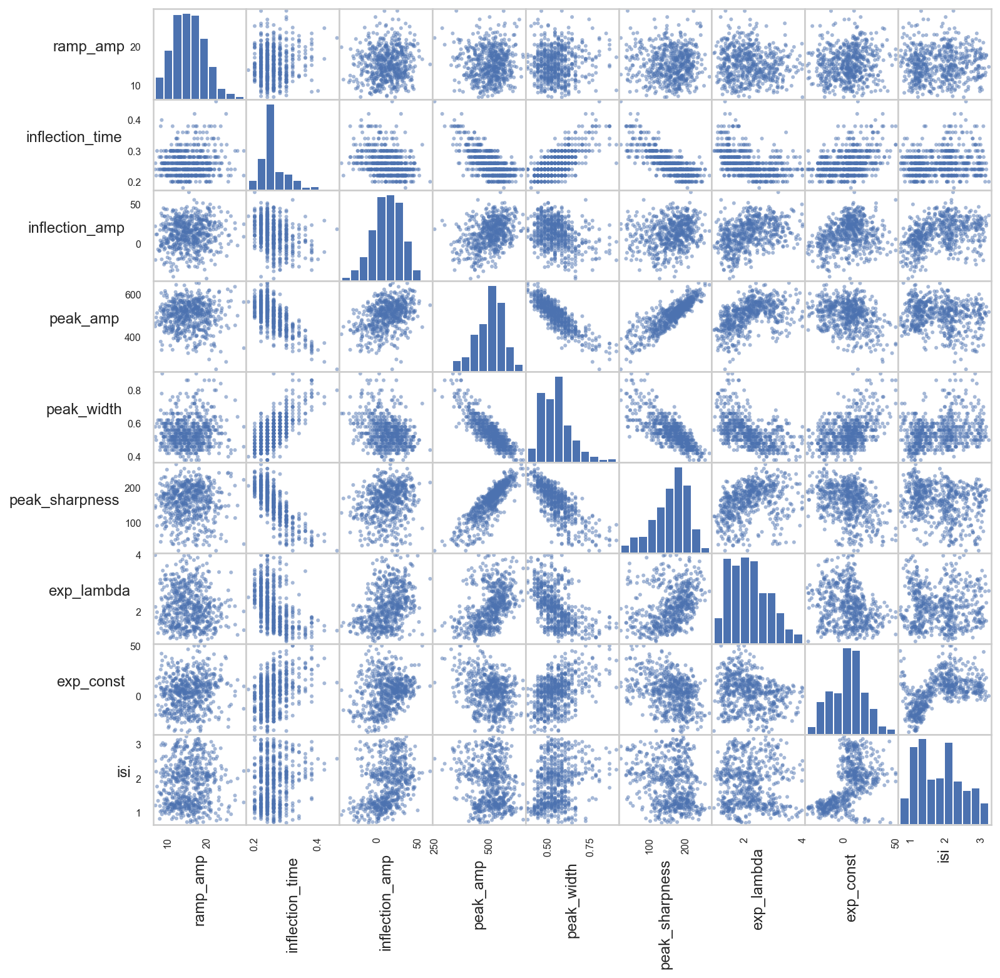

In [93]:
# plot
axes = pd.plotting.scatter_matrix(df_drop_no_gamma_m2_outliers, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


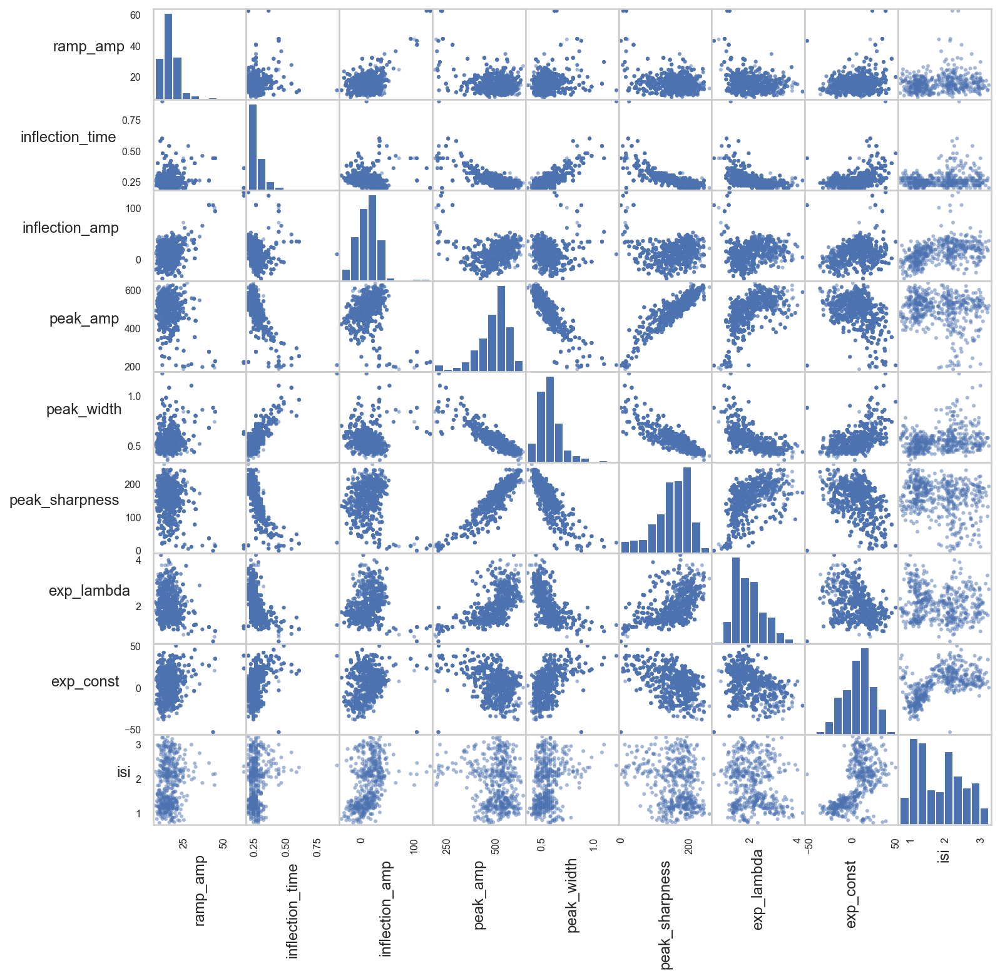

In [134]:
# Ensure inflection times are between 0 and 2 ms
df_drop_no_gamma_m3 = spk_no_gamma_features_m3.loc[spk_no_gamma_features_m3['inflection_time'] > 0.]
df_drop_no_gamma_m3 = df_drop_no_gamma_m3.loc[df_drop_no_gamma_m3['inflection_time'] < 2.]

# Remove low r-squares (ramping fits are especially noisy)
df_drop_no_gamma_m3 = df_drop_no_gamma_m3.loc[df_drop_no_gamma_m3['r_squared_exp']  >= .5]
df_drop_no_gamma_m3 = df_drop_no_gamma_m3.loc[df_drop_no_gamma_m3['r_squared_ramp'] >= .1]

# log10 ISIs
df_drop_no_gamma_m3[['isi']] = np.log10(df_drop_no_gamma_m3[['isi']])

# drop no-longer-used QC features
df_drop_no_gamma_m3 = df_drop_no_gamma_m3.drop(['r_squared_exp', 'r_squared_ramp'], axis=1)
#replace infs with NaN
df_drop_no_gamma_m3 = df_drop_no_gamma_m3.replace([np.inf, -np.inf], np.nan)

# Rotate labels
axes = pd.plotting.scatter_matrix(df_drop_no_gamma_m3, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

In [135]:
df_drop_no_gamma_m3_outliers = df_drop_no_gamma_m3[(np.abs(stats.zscore(df_drop_no_gamma_m3, nan_policy='omit')) < 3).all(axis=1)]


In [96]:
sp.plot(inds = df_drop_no_gamma_m3_outliers.index, show_points=True)

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


Error in callback <function flush_figures at 0x7f9f595e2f70> (for post_execute):


/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


KeyboardInterrupt: 

In [97]:
sp.plot_summary()

Error in callback <function _draw_all_if_interactive at 0x7f9f490d51f0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f9f595e2f70> (for post_execute):


KeyboardInterrupt: 

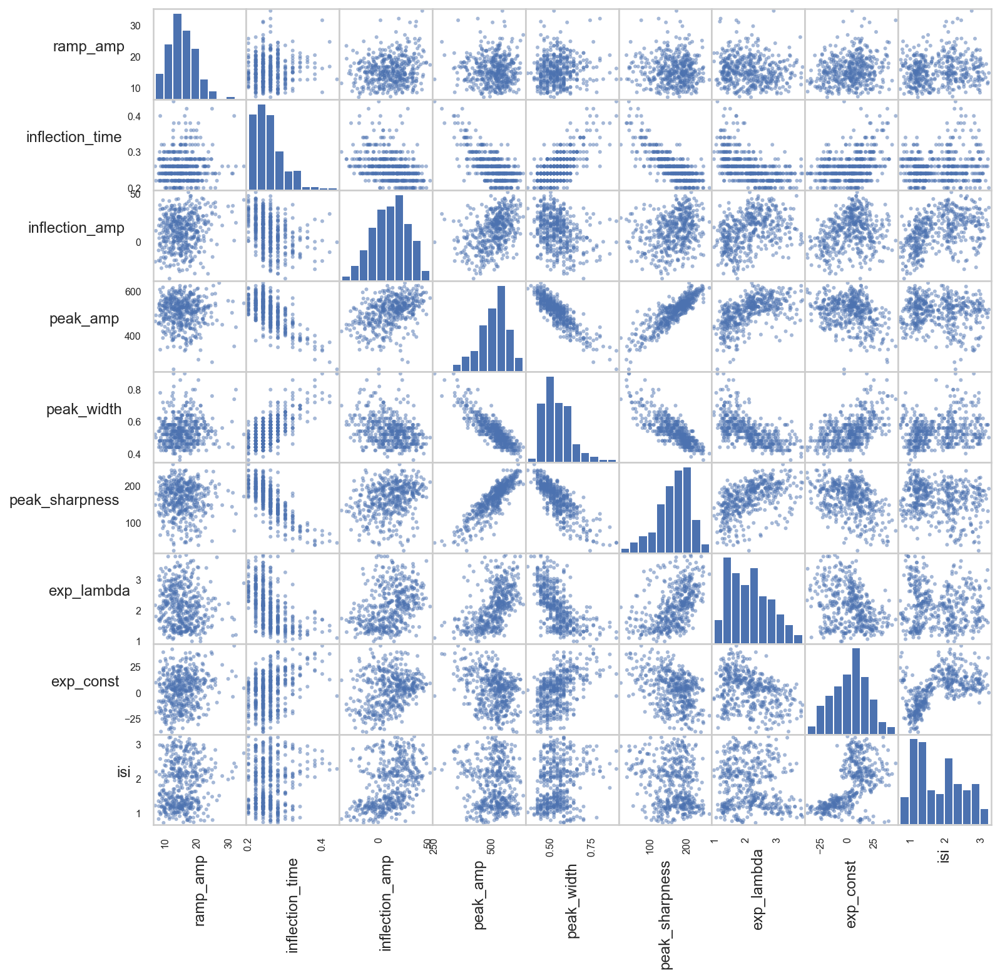

In [136]:
# plot
axes = pd.plotting.scatter_matrix(df_drop_no_gamma_m3_outliers, alpha=0.5, figsize=(12, 12))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
    
plt.show()

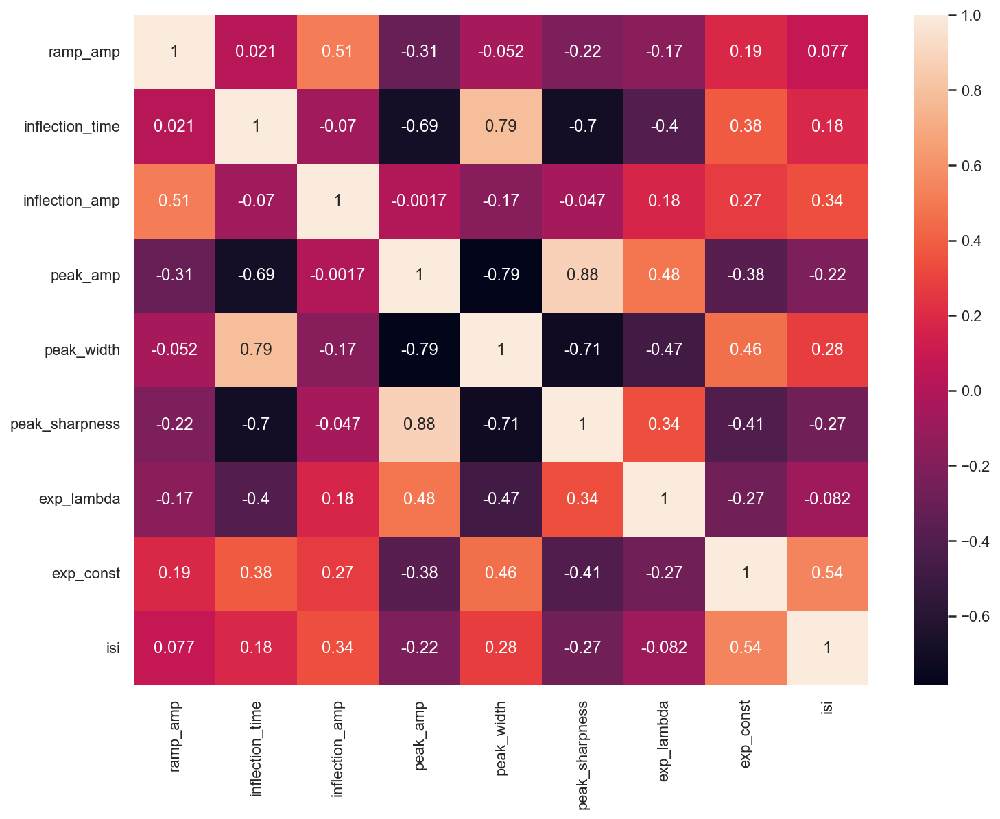

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.02,0.51***,-0.31***,-0.05**,-0.22***,-0.17***,0.19***,0.08
inflection_time,0.02,1.0***,-0.07***,-0.69***,0.79***,-0.7***,-0.4***,0.38***,0.18***
inflection_amp,0.51***,-0.07***,1.0***,-0.0,-0.17***,-0.05*,0.18***,0.27***,0.34***
peak_amp,-0.31***,-0.69***,-0.0,1.0***,-0.79***,0.88***,0.48***,-0.38***,-0.22***
peak_width,-0.05**,0.79***,-0.17***,-0.79***,1.0***,-0.71***,-0.47***,0.46***,0.28***
peak_sharpness,-0.22***,-0.7***,-0.05*,0.88***,-0.71***,1.0***,0.34***,-0.41***,-0.27***
exp_lambda,-0.17***,-0.4***,0.18***,0.48***,-0.47***,0.34***,1.0***,-0.27***,-0.08*
exp_const,0.19***,0.38***,0.27***,-0.38***,0.46***,-0.41***,-0.27***,1.0***,0.54***
isi,0.08,0.18***,0.34***,-0.22***,0.28***,-0.27***,-0.08*,0.54***,1.0***


In [137]:
spikes_corr_no_gamma_m2 = df_drop_no_gamma_m2.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_no_gamma_m2, xticklabels=spikes_corr_no_gamma_m2.columns, 
            yticklabels=spikes_corr_no_gamma_m2.columns, annot=True)
plt.show()

rho = df_drop_no_gamma_m2.corr()
pval = df_drop_no_gamma_m2.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

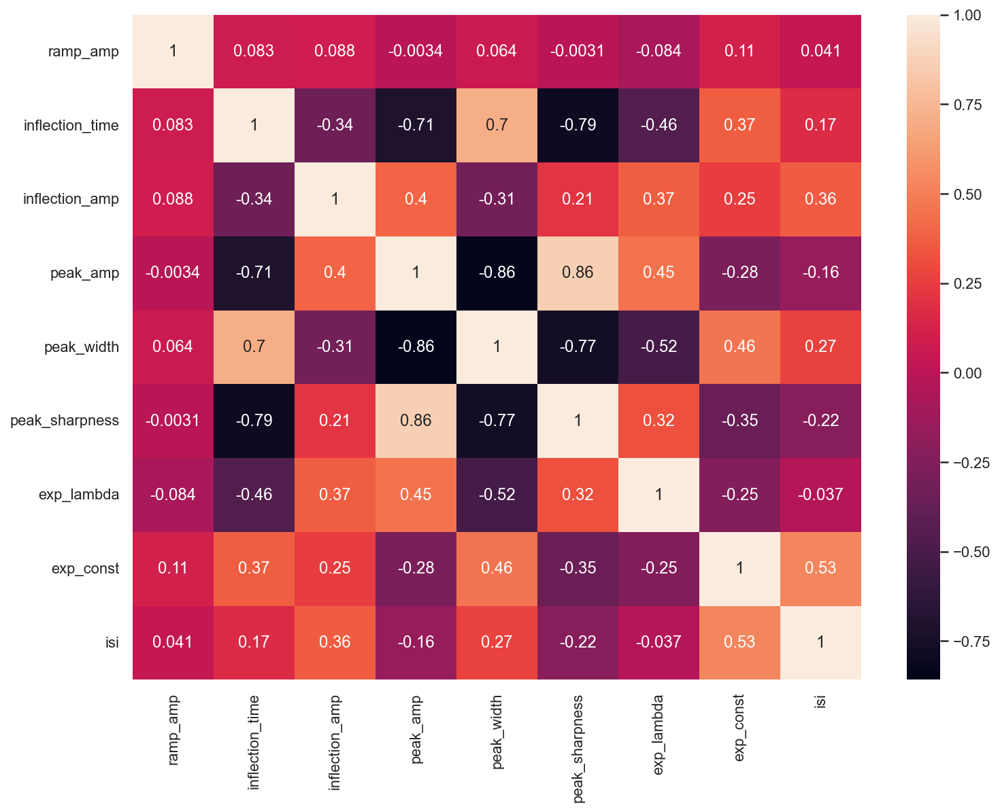

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.08*,0.09*,-0.0,0.06,-0.0,-0.08*,0.11**,0.04
inflection_time,0.08*,1.0***,-0.34***,-0.71***,0.7***,-0.79***,-0.46***,0.37***,0.17***
inflection_amp,0.09*,-0.34***,1.0***,0.4***,-0.31***,0.21***,0.37***,0.25***,0.36***
peak_amp,-0.0,-0.71***,0.4***,1.0***,-0.86***,0.86***,0.45***,-0.28***,-0.16***
peak_width,0.06,0.7***,-0.31***,-0.86***,1.0***,-0.77***,-0.52***,0.46***,0.27***
peak_sharpness,-0.0,-0.79***,0.21***,0.86***,-0.77***,1.0***,0.32***,-0.35***,-0.22***
exp_lambda,-0.08*,-0.46***,0.37***,0.45***,-0.52***,0.32***,1.0***,-0.25***,-0.04
exp_const,0.11**,0.37***,0.25***,-0.28***,0.46***,-0.35***,-0.25***,1.0***,0.53***
isi,0.04,0.17***,0.36***,-0.16***,0.27***,-0.22***,-0.04,0.53***,1.0***


In [138]:
spikes_corr_no_gamma_m2_outliers = df_drop_no_gamma_m2_outliers.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_no_gamma_m2_outliers, xticklabels=spikes_corr_no_gamma_m2_outliers.columns, 
            yticklabels=spikes_corr_no_gamma_m2_outliers, annot=True)
plt.show()

rho =  df_drop_no_gamma_m2_outliers.corr()
pval =  df_drop_no_gamma_m2_outliers.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

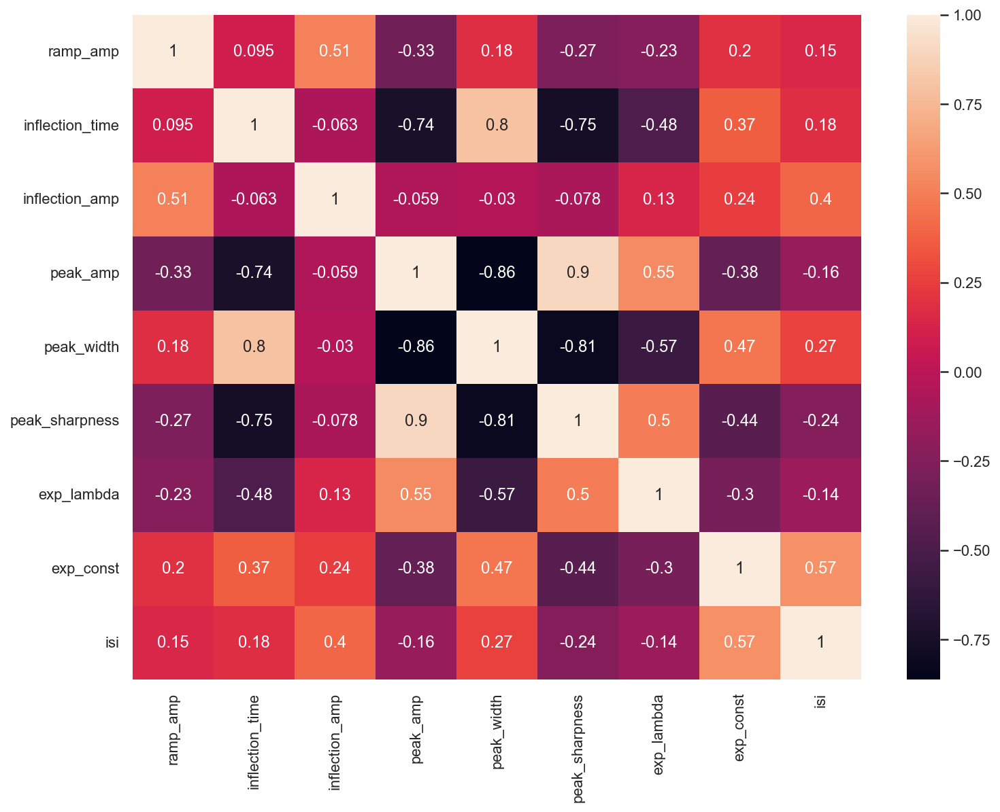

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.1***,0.51***,-0.33***,0.18***,-0.27***,-0.23***,0.2***,0.15**
inflection_time,0.1***,1.0***,-0.06**,-0.74***,0.8***,-0.75***,-0.48***,0.37***,0.18***
inflection_amp,0.51***,-0.06**,1.0***,-0.06**,-0.03,-0.08***,0.13***,0.24***,0.4***
peak_amp,-0.33***,-0.74***,-0.06**,1.0***,-0.86***,0.9***,0.55***,-0.38***,-0.16***
peak_width,0.18***,0.8***,-0.03,-0.86***,1.0***,-0.81***,-0.57***,0.47***,0.27***
peak_sharpness,-0.27***,-0.75***,-0.08***,0.9***,-0.81***,1.0***,0.5***,-0.44***,-0.24***
exp_lambda,-0.23***,-0.48***,0.13***,0.55***,-0.57***,0.5***,1.0***,-0.3***,-0.14**
exp_const,0.2***,0.37***,0.24***,-0.38***,0.47***,-0.44***,-0.3***,1.0***,0.57***
isi,0.15**,0.18***,0.4***,-0.16***,0.27***,-0.24***,-0.14**,0.57***,1.0***


In [139]:
spikes_corr_no_gamma_m3 = df_drop_no_gamma_m3.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_no_gamma_m3, xticklabels=spikes_corr_no_gamma_m3.columns, 
            yticklabels=spikes_corr_no_gamma_m3.columns, annot=True)
plt.show()

rho = df_drop_no_gamma_m3.corr()
pval = df_drop_no_gamma_m3.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

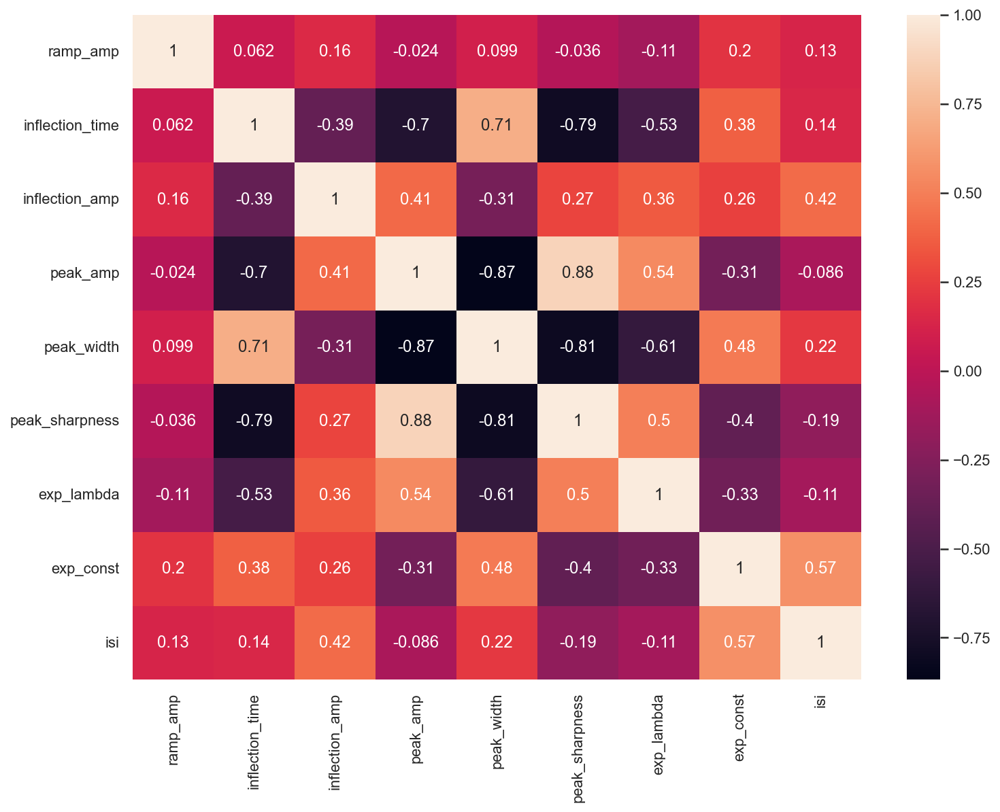

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
ramp_amp,1.0***,0.06,0.16***,-0.02,0.1*,-0.04,-0.11*,0.2***,0.13**
inflection_time,0.06,1.0***,-0.39***,-0.7***,0.71***,-0.79***,-0.53***,0.38***,0.14**
inflection_amp,0.16***,-0.39***,1.0***,0.41***,-0.31***,0.27***,0.36***,0.26***,0.42***
peak_amp,-0.02,-0.7***,0.41***,1.0***,-0.87***,0.88***,0.54***,-0.31***,-0.09
peak_width,0.1*,0.71***,-0.31***,-0.87***,1.0***,-0.81***,-0.61***,0.48***,0.22***
peak_sharpness,-0.04,-0.79***,0.27***,0.88***,-0.81***,1.0***,0.5***,-0.4***,-0.19***
exp_lambda,-0.11*,-0.53***,0.36***,0.54***,-0.61***,0.5***,1.0***,-0.33***,-0.11*
exp_const,0.2***,0.38***,0.26***,-0.31***,0.48***,-0.4***,-0.33***,1.0***,0.57***
isi,0.13**,0.14**,0.42***,-0.09,0.22***,-0.19***,-0.11*,0.57***,1.0***


In [140]:
spikes_corr_no_gamma_m3_outliers = df_drop_no_gamma_m3_outliers.corr()

# Plot the heatmap and annotation on it
sns.heatmap(spikes_corr_no_gamma_m3_outliers, xticklabels=spikes_corr_no_gamma_m3_outliers.columns, 
            yticklabels=spikes_corr_no_gamma_m3_outliers, annot=True)
plt.show()

rho =  df_drop_no_gamma_m3_outliers.corr()
pval =  df_drop_no_gamma_m3_outliers.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

##### Compare features between gamma and no gamma spike groups (initial descriptive)

In [141]:
columns = df_drop_gamma_m2.columns.values.tolist()

In [142]:
df_drop_gamma_m2.mean()

ramp_amp            16.895697
inflection_time      0.273213
inflection_amp      15.600226
peak_amp           486.880368
peak_width           0.571852
peak_sharpness     149.482705
exp_lambda           1.944345
exp_const            8.112202
isi                  1.835160
dtype: float64

In [143]:
df_drop_gamma_m3.mean()

ramp_amp            16.639918
inflection_time      0.271509
inflection_amp      15.367980
peak_amp           488.086145
peak_width           0.571969
peak_sharpness     149.217222
exp_lambda           1.982686
exp_const            7.757575
isi                  1.869521
dtype: float64

In [144]:
df_drop_no_gamma_m2.mean()

ramp_amp            16.257996
inflection_time      0.272372
inflection_amp      13.762665
peak_amp           482.330681
peak_width           0.577101
peak_sharpness     146.100611
exp_lambda           2.021733
exp_const            7.587608
isi                  1.841863
dtype: float64

In [145]:
df_drop_no_gamma_m3.mean()

ramp_amp            16.548869
inflection_time      0.270855
inflection_amp      13.105340
peak_amp           484.355811
peak_width           0.575976
peak_sharpness     149.803108
exp_lambda           1.950239
exp_const            6.551923
isi                  1.826755
dtype: float64

In [146]:
df_drop_gamma_m2.std()

ramp_amp            6.502352
inflection_time     0.078012
inflection_amp     21.036476
peak_amp           82.452368
peak_width          0.110855
peak_sharpness     51.249150
exp_lambda          0.645937
exp_const          16.774681
isi                 0.657616
dtype: float64

In [147]:
df_drop_gamma_m3.std()

ramp_amp            6.002219
inflection_time     0.072114
inflection_amp     19.584925
peak_amp           79.484142
peak_width          0.106134
peak_sharpness     51.260086
exp_lambda          0.666875
exp_const          16.254532
isi                 0.666133
dtype: float64

In [148]:
df_drop_no_gamma_m2.std()

ramp_amp            7.658149
inflection_time     0.069356
inflection_amp     22.003161
peak_amp           79.590432
peak_width          0.119203
peak_sharpness     53.406998
exp_lambda          0.666787
exp_const          16.704585
isi                 0.637007
dtype: float64

In [149]:
df_drop_no_gamma_m3.std()

ramp_amp            6.480926
inflection_time     0.062972
inflection_amp     22.015884
peak_amp           81.706820
peak_width          0.113339
peak_sharpness     52.253434
exp_lambda          0.631470
exp_const          16.770739
isi                 0.655921
dtype: float64

##### Stats for compared features

In [150]:
# Combine group dataframes into one df with a tag column
groups_m2 = {'gamma': df_drop_gamma_m2, 'no_gamma': df_drop_no_gamma_m2}
df_concate_ggroups_m2 = pd.concat(groups_m2, names=['LFP_class'])
df_concate_ggroups_m2 = df_concate_ggroups_m2.reset_index(level=0)



In [151]:
# Combine group dataframes into one df with a tag column
groups_m3 = {'gamma': df_drop_gamma_m3, 'no_gamma': df_drop_no_gamma_m3}
df_concate_ggroups_m3 = pd.concat(groups_m3, names=['LFP_class'])
df_concate_ggroups_m3 = df_concate_ggroups_m3.reset_index(level=0)


In [152]:
#OUTLIER GROUPS
groups_m2_out = {'gamma': df_drop_gamma_m2_outliers, 'no_gamma': df_drop_no_gamma_m2_outliers}
df_concate_ggroups_m2_out = pd.concat(groups_m2_out, names=['LFP_class'])
df_concate_ggroups_m2_out = df_concate_ggroups_m2_out.reset_index(level=0)

groups_m3_out = {'gamma': df_drop_gamma_m3_outliers, 'no_gamma': df_drop_no_gamma_m3_outliers}
df_concate_ggroups_m3_out = pd.concat(groups_m3_out, names=['LFP_class'])
df_concate_ggroups_m3_out = df_concate_ggroups_m3_out.reset_index(level=0)


In [153]:
df_concate_ggroups_m2

,LFP_class,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
21,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
22,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
23,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
24,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
25,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,1.491714
...,...,...,...,...,...,...,...,...,...,...
25477,no_gamma,20.655254,0.26,1.349417,471.396537,0.56,161.385371,1.511226,20.370685,NaN
25478,no_gamma,20.655254,0.26,1.349417,471.396537,0.56,161.385371,1.511226,20.370685,0.828453
25479,no_gamma,21.168392,0.62,51.405285,202.248656,1.06,16.256531,0.691562,12.320187,NaN
25480,no_gamma,21.168392,0.62,51.405285,202.248656,1.06,16.256531,0.691562,12.320187,NaN


In [154]:
df_concate_ggroups_m3

,LFP_class,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi
21,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
22,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
23,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
24,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,NaN
25,gamma,18.679983,0.26,-16.844094,380.923194,0.66,104.931446,2.765641,-9.252601,1.491714
...,...,...,...,...,...,...,...,...,...,...
24650,no_gamma,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,NaN
24651,no_gamma,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,NaN
24652,no_gamma,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,NaN
24653,no_gamma,12.572567,0.36,4.214918,382.464264,0.66,98.773851,1.278701,33.052280,NaN


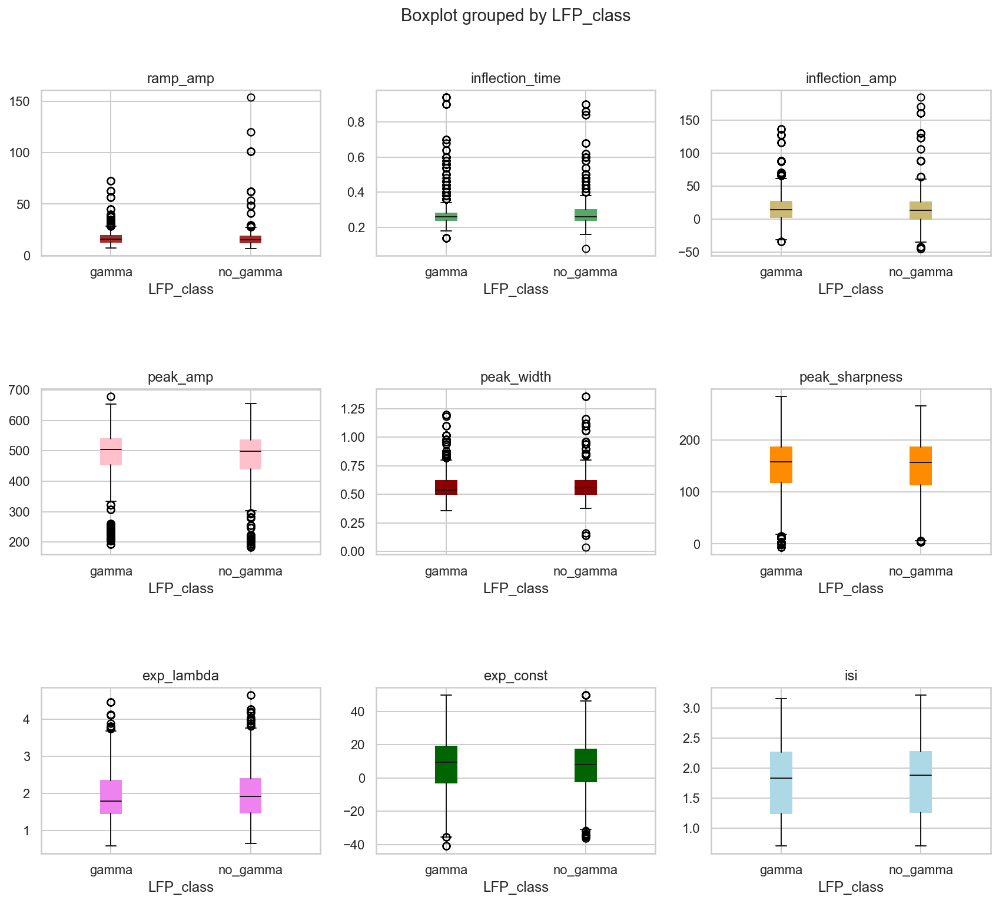

In [155]:
# initialize figure with 4 subplots in a row
fig, ax = plt.subplots(3, 3, figsize=(14, 12))
# add padding between the subplots
plt.subplots_adjust(hspace=.8) 

rows_count = 0
cols_count = 0

colors = ['brown', 'g', 'y', 'pink', 'darkred', 'darkorange', 'violet', 'darkgreen', 'lightblue']

for c in range(len(columns)):
    # draw boxplot - ramp amp 
    df_concate_ggroups_m2.boxplot(column=columns[c], by='LFP_class', ax=ax[rows_count][cols_count],
                                  color=dict(boxes=colors[c], whiskers='k', medians='k', caps='k'), patch_artist = True)
    
    cols_count = cols_count + 1
    
    if cols_count == 3:
        cols_count = 0
        rows_count = rows_count + 1



for subplot in ax:
    #subplot.set_xticklabels([])

    plt.show()

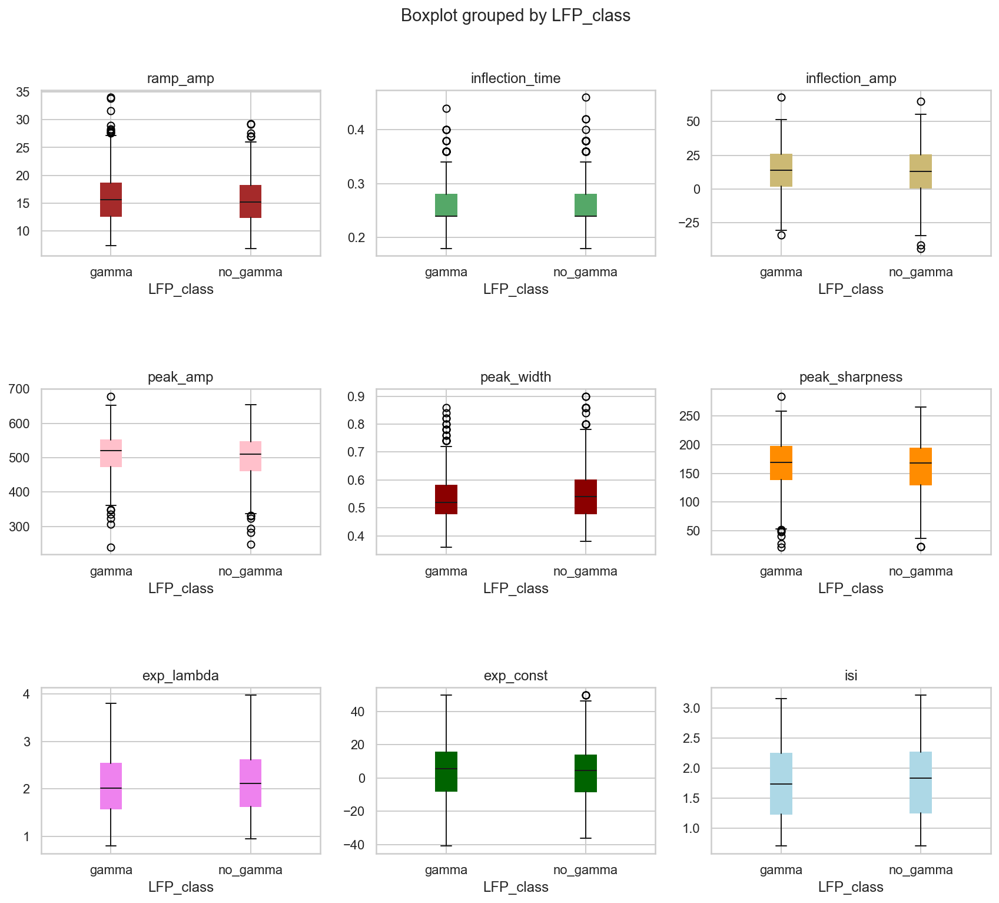

In [156]:
# initialize figure with 4 subplots in a row
fig, ax = plt.subplots(3, 3, figsize=(14, 12))
# add padding between the subplots
plt.subplots_adjust(hspace=.8) 

rows_count = 0
cols_count = 0

colors = ['brown', 'g', 'y', 'pink', 'darkred', 'darkorange', 'violet', 'darkgreen', 'lightblue']

for c in range(len(columns)):
    # draw boxplot - ramp amp 
    df_concate_ggroups_m2_out.boxplot(column=columns[c], by='LFP_class', ax=ax[rows_count][cols_count],
                                  color=dict(boxes=colors[c], whiskers='k', medians='k', caps='k'), patch_artist = True)
    
    cols_count = cols_count + 1
    
    if cols_count == 3:
        cols_count = 0
        rows_count = rows_count + 1



for subplot in ax:
    #subplot.set_xticklabels([])

    plt.show()

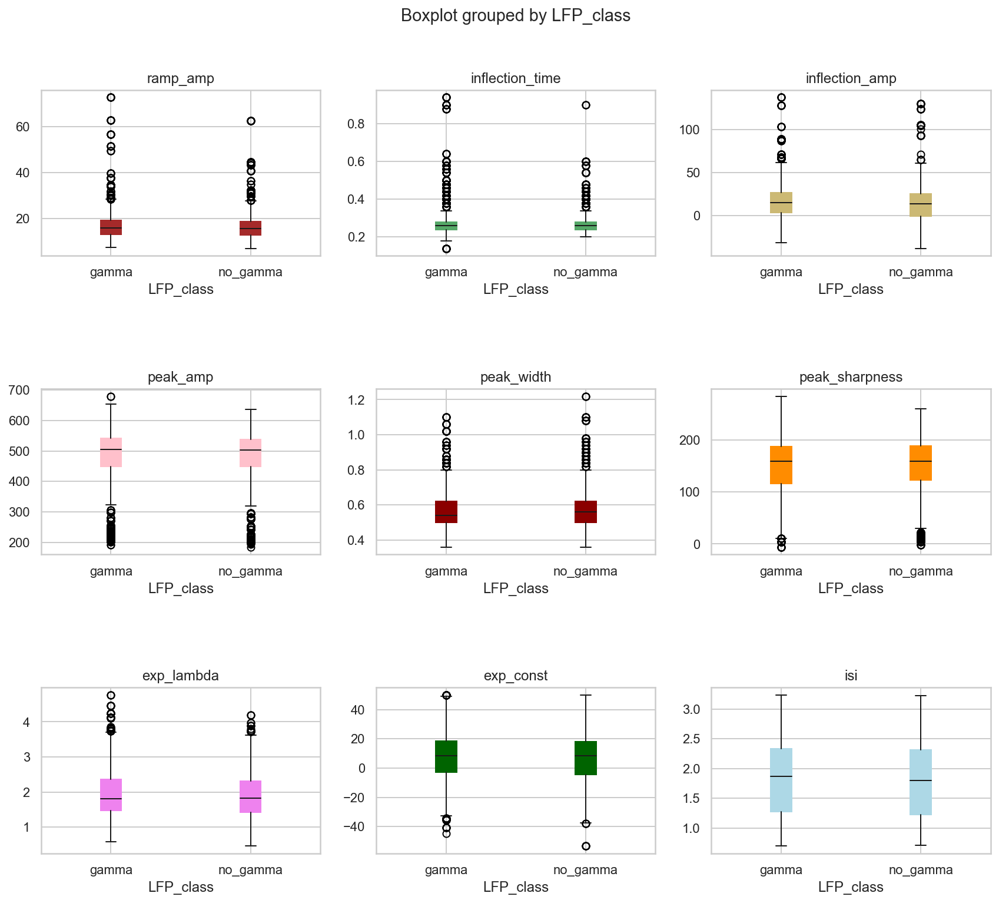

In [157]:
# initialize figure with 4 subplots in a row
fig, ax = plt.subplots(3, 3, figsize=(14, 12))
# add padding between the subplots
plt.subplots_adjust(hspace=.8) 

rows_count = 0
cols_count = 0

colors = ['brown', 'g', 'y', 'pink', 'darkred', 'darkorange', 'violet', 'darkgreen', 'lightblue']

for c in range(len(columns)):
    # draw boxplot - ramp amp 
    df_concate_ggroups_m3.boxplot(column=columns[c], by='LFP_class', ax=ax[rows_count][cols_count],
                                  color=dict(boxes=colors[c], whiskers='k', medians='k', caps='k'), patch_artist = True)
    
    cols_count = cols_count + 1
    
    if cols_count == 3:
        cols_count = 0
        rows_count = rows_count + 1



for subplot in ax:
    #subplot.set_xticklabels([])

    plt.show()
    

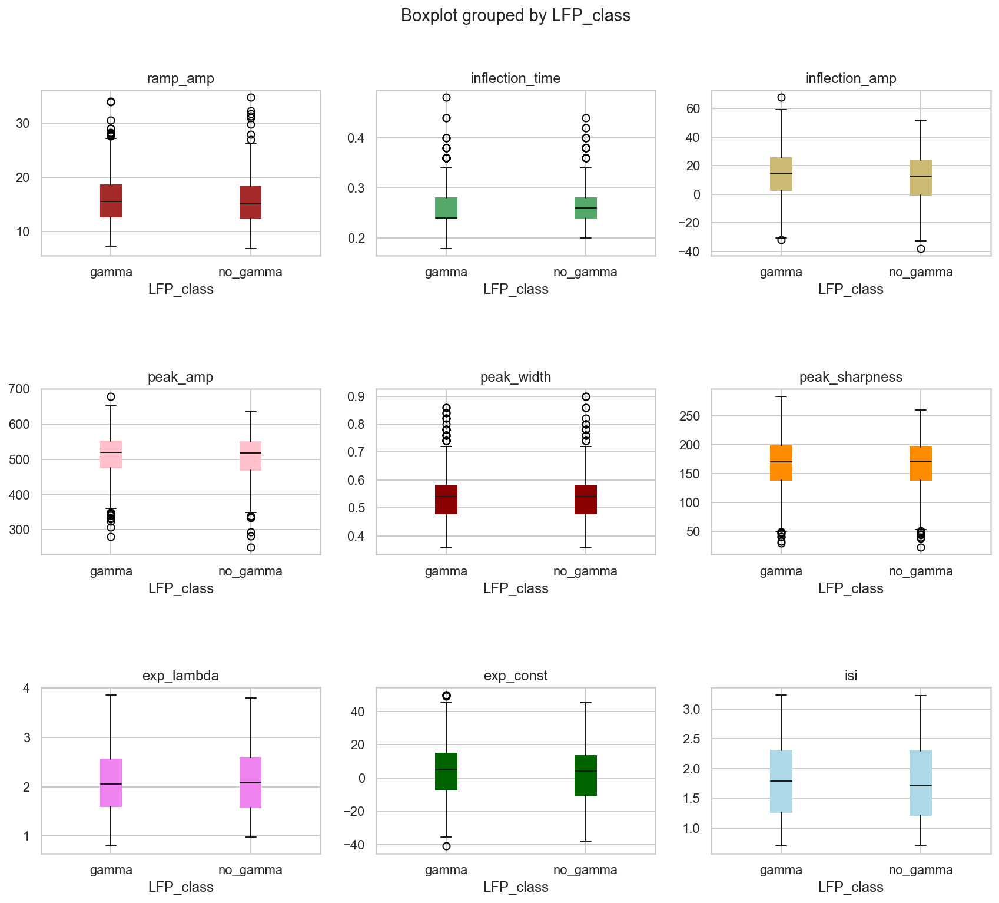

In [158]:
# initialize figure with 4 subplots in a row
fig, ax = plt.subplots(3, 3, figsize=(14, 12))
# add padding between the subplots
plt.subplots_adjust(hspace=.8) 

rows_count = 0
cols_count = 0

colors = ['brown', 'g', 'y', 'pink', 'darkred', 'darkorange', 'violet', 'darkgreen', 'lightblue']

for c in range(len(columns)):
    # draw boxplot - ramp amp 
    df_concate_ggroups_m3_out.boxplot(column=columns[c], by='LFP_class', ax=ax[rows_count][cols_count],
                                  color=dict(boxes=colors[c], whiskers='k', medians='k', caps='k'), patch_artist = True)
    
    cols_count = cols_count + 1
    
    if cols_count == 3:
        cols_count = 0
        rows_count = rows_count + 1



for subplot in ax:
    #subplot.set_xticklabels([])

    plt.show()
    

##### Run t-tests for variables

In [159]:
for c in columns:
    print(c + " t-test")
    print(stats.ttest_ind(df_concate_ggroups_m2[c][df_concate_ggroups_m2['LFP_class'] == 'gamma'],
                    df_concate_ggroups_m2[c][df_concate_ggroups_m2['LFP_class'] == 'no_gamma'], nan_policy='omit'))

ramp_amp t-test
Ttest_indResult(statistic=3.2613544201858113, pvalue=0.0011157905035652283)
inflection_time t-test
Ttest_indResult(statistic=0.41660685360524274, pvalue=0.6769827776591104)
inflection_amp t-test
Ttest_indResult(statistic=3.1097529436166447, pvalue=0.0018823228357443972)
peak_amp t-test
Ttest_indResult(statistic=2.049007310681901, pvalue=0.04051027684972032)
peak_width t-test
Ttest_indResult(statistic=-1.6600305144846847, pvalue=0.09696716090201686)
peak_sharpness t-test
Ttest_indResult(statistic=2.35411265309591, pvalue=0.01860308961832372)
exp_lambda t-test
Ttest_indResult(statistic=-4.295716038549557, pvalue=1.772287980423852e-05)
exp_const t-test
Ttest_indResult(statistic=1.1428689688857505, pvalue=0.2531443493870295)
isi t-test
Ttest_indResult(statistic=-0.1767870278583923, pvalue=0.8597063542726321)


In [160]:
for c in columns:
    print(c + " t-test")
    print(stats.ttest_ind(df_concate_ggroups_m2_out[c][df_concate_ggroups_m2_out['LFP_class'] == 'gamma'],
                    df_concate_ggroups_m2_out[c][df_concate_ggroups_m2_out['LFP_class'] == 'no_gamma'], nan_policy='omit'))

ramp_amp t-test
Ttest_indResult(statistic=1.6889792458098511, pvalue=0.091504258447936)
inflection_time t-test
Ttest_indResult(statistic=-1.0566862045300573, pvalue=0.2908847418139619)
inflection_amp t-test
Ttest_indResult(statistic=0.6880858204439623, pvalue=0.4915425046269465)
peak_amp t-test
Ttest_indResult(statistic=2.5319423895403514, pvalue=0.011480295561702516)
peak_width t-test
Ttest_indResult(statistic=-1.6537658823357437, pvalue=0.09845783649105938)
peak_sharpness t-test
Ttest_indResult(statistic=2.121939819450394, pvalue=0.034063816991172925)
exp_lambda t-test
Ttest_indResult(statistic=-1.5748340171820692, pvalue=0.11557971767256504)
exp_const t-test
Ttest_indResult(statistic=0.4018374772785166, pvalue=0.6878809953547889)
isi t-test
Ttest_indResult(statistic=-0.4758570594635148, pvalue=0.6342698534074818)


In [161]:
for c in columns:
    print(c + " t-test")
    print(stats.ttest_ind(df_concate_ggroups_m3[c][df_concate_ggroups_m3['LFP_class'] == 'gamma'],
                    df_concate_ggroups_m3[c][df_concate_ggroups_m3['LFP_class'] == 'no_gamma'], nan_policy='omit'))

ramp_amp t-test
Ttest_indResult(statistic=0.5405405194132437, pvalue=0.5888452218033182)
inflection_time t-test
Ttest_indResult(statistic=0.34898067594229987, pvalue=0.7271165707696109)
inflection_amp t-test
Ttest_indResult(statistic=4.047767786324713, pvalue=5.23859771676368e-05)
peak_amp t-test
Ttest_indResult(statistic=1.705406732484966, pvalue=0.08817250173654424)
peak_width t-test
Ttest_indResult(statistic=-1.3513434128630222, pvalue=0.17663851327117788)
peak_sharpness t-test
Ttest_indResult(statistic=-0.4166722111643424, pvalue=0.6769337065478515)
exp_lambda t-test
Ttest_indResult(statistic=1.8221902785382076, pvalue=0.06847793900090968)
exp_const t-test
Ttest_indResult(statistic=2.6914649956734635, pvalue=0.00713444465682041)
isi t-test
Ttest_indResult(statistic=1.1113392566908662, pvalue=0.2666363996739912)


In [162]:
for c in columns:
    print(c + " t-test")
    print(stats.ttest_ind(df_concate_ggroups_m3_out[c][df_concate_ggroups_m3_out['LFP_class'] == 'gamma'],
                    df_concate_ggroups_m3_out[c][df_concate_ggroups_m3_out['LFP_class'] == 'no_gamma'], nan_policy='omit'))

ramp_amp t-test
Ttest_indResult(statistic=1.1935955832262095, pvalue=0.23287429552132824)
inflection_time t-test
Ttest_indResult(statistic=-0.6531154075867744, pvalue=0.5138081458177344)
inflection_amp t-test
Ttest_indResult(statistic=2.1600232154902432, pvalue=0.03097021668459209)
peak_amp t-test
Ttest_indResult(statistic=0.9546818743410488, pvalue=0.3399326481755748)
peak_width t-test
Ttest_indResult(statistic=0.12077092976717513, pvalue=0.9038928811846471)
peak_sharpness t-test
Ttest_indResult(statistic=-0.003150567699601555, pvalue=0.9974867433315543)
exp_lambda t-test
Ttest_indResult(statistic=0.10797813936190268, pvalue=0.9140312506404479)
exp_const t-test
Ttest_indResult(statistic=1.5756006536310634, pvalue=0.11538388307161589)
isi t-test
Ttest_indResult(statistic=1.012713833468106, pvalue=0.311402903046171)


##### Compare cross correlation matrices

In [163]:
upper(spikes_corr_gamma_m2)

array([ 1.28259657e-01,  4.91795244e-01, -3.79930672e-01,  1.73858051e-01,
       -3.16433915e-01, -2.38157236e-01,  2.20628129e-01,  1.30465215e-01,
        9.74732703e-02, -7.01197124e-01,  7.57996252e-01, -7.04476301e-01,
       -3.84470560e-01,  2.91151592e-01,  2.27090995e-01, -1.25922236e-01,
       -3.59000480e-04, -1.39919879e-01,  1.31603415e-01,  2.51771869e-01,
        4.04491706e-01, -8.42074382e-01,  9.01323477e-01,  4.29707640e-01,
       -3.34529447e-01, -2.55656573e-01, -7.82207320e-01, -4.95852058e-01,
        4.20209405e-01,  3.21944768e-01,  3.49109395e-01, -3.71650391e-01,
       -3.12615285e-01, -2.25104728e-01, -1.15047180e-01,  5.28714150e-01])

In [126]:
upper(spikes_corr_gamma_m3)

array([ 7.74854198e-02,  4.45905724e-01, -3.01254242e-01,  1.46289791e-01,
       -2.33187300e-01, -2.04643995e-01,  2.42123351e-01,  1.23393414e-01,
        1.98692820e-02, -6.79061670e-01,  7.19089851e-01, -6.83169288e-01,
       -3.51697014e-01,  3.02144118e-01,  2.13025221e-01,  1.49757484e-04,
       -8.17745577e-02, -4.17373845e-02,  1.77467909e-01,  2.39903457e-01,
        3.52395918e-01, -8.43083294e-01,  8.88750228e-01,  3.94533334e-01,
       -3.28439550e-01, -2.26144817e-01, -7.77968519e-01, -4.88953856e-01,
        4.23233466e-01,  3.02291143e-01,  2.76611511e-01, -3.53025268e-01,
       -2.96372871e-01, -2.47633508e-01, -1.18727355e-01,  5.43657915e-01])

In [127]:
upper(spikes_corr_no_gamma_m2)

array([ 0.02062468,  0.51243129, -0.3098127 , -0.05246488, -0.21770892,
       -0.17089094,  0.19099529,  0.07740591, -0.07008184, -0.69446358,
        0.78874299, -0.69592219, -0.39522425,  0.37971091,  0.1794235 ,
       -0.00165754, -0.17475847, -0.04708917,  0.17517408,  0.26805266,
        0.33763599, -0.78529867,  0.87580574,  0.48472233, -0.37834594,
       -0.22024248, -0.70942724, -0.47302707,  0.45863948,  0.27650743,
        0.34406742, -0.41053761, -0.2707215 , -0.26668632, -0.08162848,
        0.54372991])

In [128]:
#extract upper triangles of correlation matrix
# Measure the similarity 
print(stats.spearmanr(upper(spikes_corr_gamma_m2), upper(spikes_corr_no_gamma_m2)))

SignificanceResult(statistic=0.9832689832689833, pvalue=9.892122169539597e-27)


In [129]:
#extract upper triangles of correlation matrix
# Measure the similarity 
print(stats.spearmanr(upper(spikes_corr_gamma_m2), upper(spikes_corr_gamma_m3)))

SignificanceResult(statistic=0.9925353925353926, pvalue=1.1670812262802114e-32)


In [130]:
#extract upper triangles of correlation matrix
# Measure the similarity 
print(stats.spearmanr(upper(spikes_corr_gamma_m2), upper(spikes_corr_no_gamma_m3)))

SignificanceResult(statistic=0.992792792792793, pvalue=6.43975087500034e-33)


In [131]:
#extract upper triangles of correlation matrix
# Measure the similarity 
print(stats.spearmanr(upper(spikes_corr_gamma_m3), upper(spikes_corr_no_gamma_m2)))

SignificanceResult(statistic=0.9925353925353926, pvalue=1.1670812262802114e-32)


##### Data is not independent so using this pvalues is misleading. To test for significance:

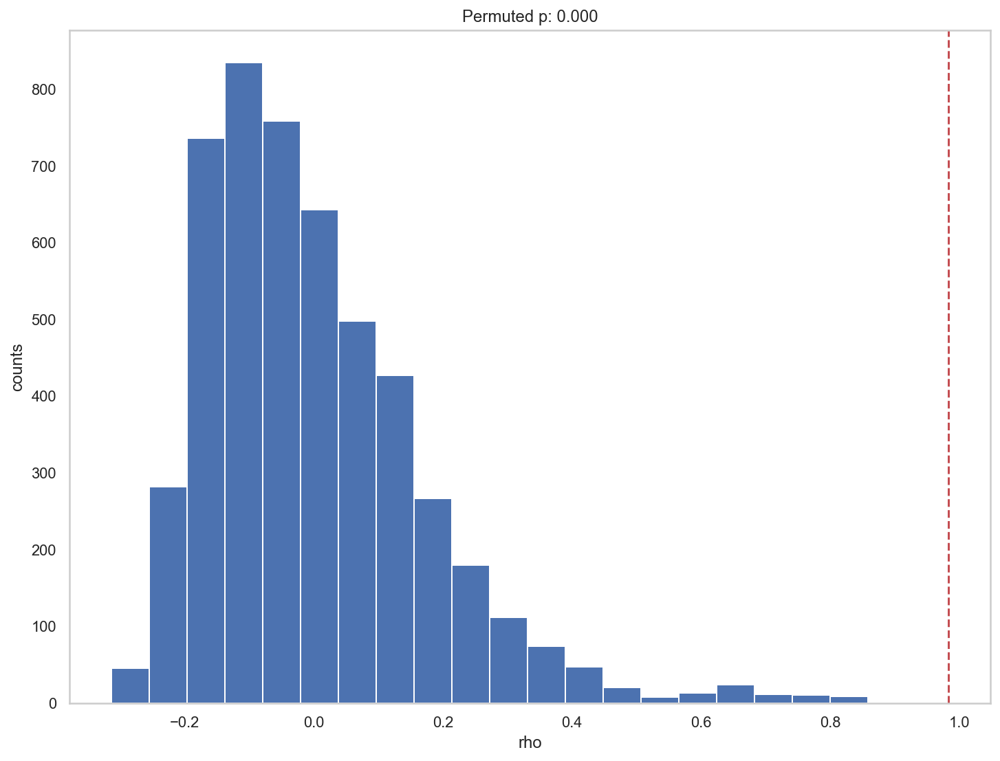

In [132]:
"""Nonparametric permutation testing Monte Carlo"""
np.random.seed(0)
rhos = []
n_iter = 5000
true_rho, _ = stats.spearmanr(upper(spikes_corr_gamma_m2), upper(spikes_corr_no_gamma_m2))
# matrix permutation, shuffle the groups
m_ids = list(spikes_corr_gamma_m2.columns)
m2_v = upper(spikes_corr_no_gamma_m2)
for iter in range(n_iter):
  np.random.shuffle(m_ids) # shuffle list 
  r, _ = stats.spearmanr(upper(spikes_corr_gamma_m2.loc[m_ids, m_ids]), m2_v)  
  rhos.append(r)
perm_p = ((np.sum(np.abs(true_rho) <= np.abs(rhos)))+1)/(n_iter+1) # two-tailed test


f,ax = plt.subplots()
plt.hist(rhos,bins=20)
ax.axvline(true_rho,  color = 'r', linestyle='--')
ax.set(title=f"Permuted p: {perm_p:.3f}", ylabel="counts", xlabel="rho")
plt.show()

##### Cross-correlation matrices are significantly similar :()

In [686]:
test2 = cosine_similarity(spikes_corr_gamma_m2, spikes_corr_no_gamma_m2)

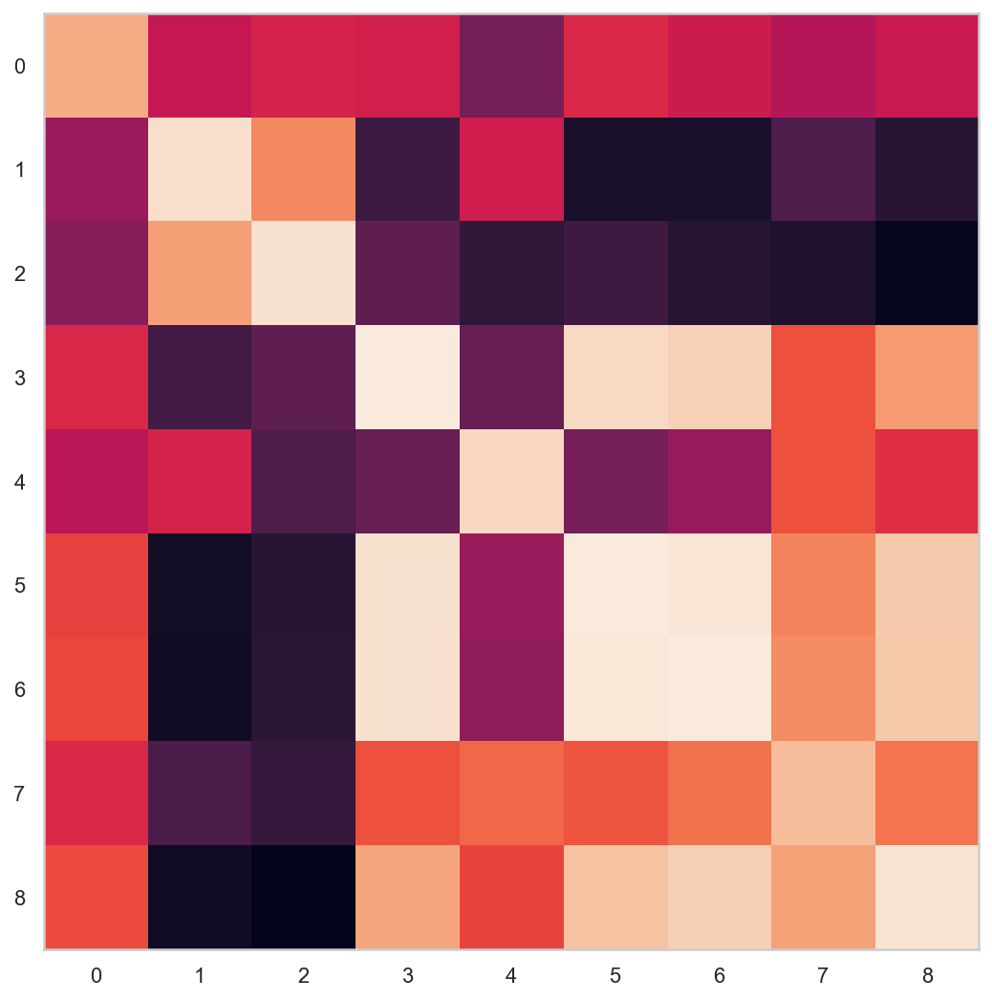

In [688]:
plt.imshow(test2)

In [542]:
test = sp.distance.cdist(spikes_corr_gamma_m2, spikes_corr_no_gamma_m2, 'cosine')

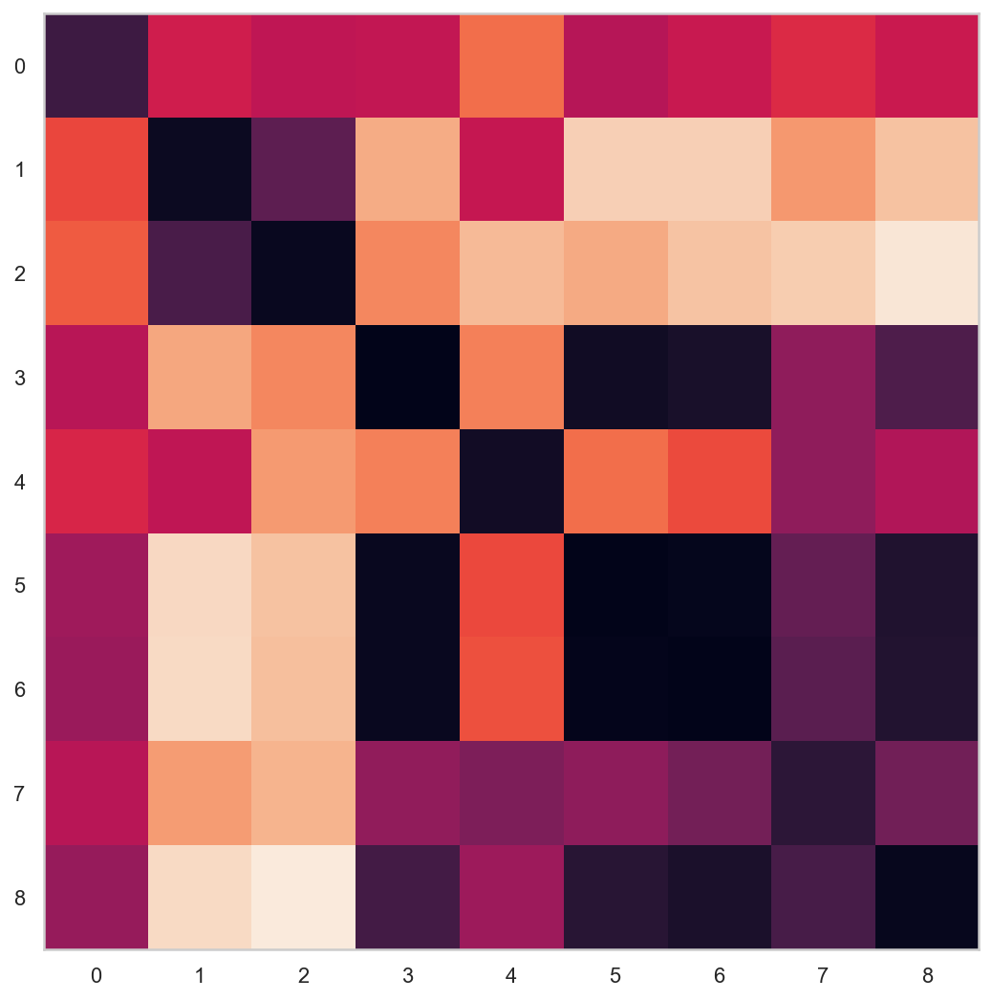

In [543]:
plt.imshow(test)

### Look into burst/number of spikes info